In [403]:
# imports


import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import random
from   scipy.stats import multivariate_normal
from mpl_toolkits import mplot3d
import matplotlib.animation as animation
import glob
from PIL import Image

In [850]:
# helper functions

lowerb_x, upperb_x, lowerb_y, upperb_y = bounds = (80, 165, 50, 90)


def pre_process(im, bounds= (80, 165, 50, 90), cutoff=25):
    """
    cropping image
    shrinking by an amount
    cutoff off certain level of noise
    etc
    """
    lowerb_x, upperb_x, lowerb_y, upperb_y = bounds
    
    im = im[lowerb_x:upperb_x, lowerb_y:upperb_y] # crop
    im = np.where(im == 300, 0, im) # take out frame
    im = np.where(im < cutoff, 0, im)  # cut off noise
    
    
    return im

def generate_dataset(im, N=1000, seed=True):
    random_selection = []
    
    for i in range(len(im[0])):
        for j in range(len(im)):
            random_selection.extend(int(im[j, i])*[(i, j)])

    data = []
    if seed:
        np.random.seed(0)
    vals = np.random.choice(len(random_selection), N, replace=True)
    for val in vals:
        data.append([np.random.uniform(random_selection[val][0], random_selection[val][0]+1),np.random.uniform(random_selection[val][1], random_selection[val][1]+1)])
    data = np.array(data)
    return data

def initialize_params(x, K):
    n = len(x)
    indices = np.arange(n)
    random.shuffle(indices)
    groups = []
    for i in range(K):
        groups.append(x[indices[i*n//K:(i+1)*n//K],:])

#     mu = np.mean(groups, axis=1)
    mu = np.array([[20,38], [18, 68]])
    sigma = np.array([(groups[i]-mu[i]).T@(groups[i]-mu[i])/len(groups[i]) for i in range(K)]) 
    phi = np.ones(K)/K
    w = np.ones((len(x), K))/K
    return w, phi, mu, sigma

def visualize(image, data, w, phi, mu, sigma, points=500, levels=20, threeD=False):
    fig, axe = plt.subplots(1, 2, figsize=(8.5, 8))
    
    x = np.linspace(0, upperb_y-lowerb_y, points) 
    y = np.linspace(0, upperb_x-lowerb_x, points)
    
    X,Y = np.meshgrid(x, y)
    pos  = np.dstack((X, Y))
    Z = sum([phi[i]*multivariate_normal(mu[i], sigma[i]).pdf(pos) for i in range(len(mu))])
    
    axe[0].imshow(image, cmap='Greys', origin='lower left')
    axe[0].contour(X, Y, Z , levels=levels, linewidths=1)
    axe[0].scatter(mu[:,0], mu[:,1], color='green', s=40, marker='x')

    colorbar_data = axe[1].scatter(data[:,0], data[:,1], s=5, c=w[:,0], cmap='RdBu')
    x_tilde = np.array([[20,38], [18, 68]])
    axe[1].scatter(x_tilde[:,0], x_tilde[:,1], s=40, marker='x', color='green')
    axe[1].contour(X, Y, Z, levels=levels, linewidths=1)
    fig.colorbar(colorbar_data, ax=axe[1])
    plt.show()
    ret = [axe]
    if threeD:
        fig = plt.figure(figsize=(14,9))
        ax = plt.axes(projection='3d')
        ax.view_init(65, -30)

        ax.plot_surface(X, Y, Z, cmap='binary')
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_zlabel('z')
        ax.set_title('Cloud Density Reconstruction')
        plt.show()
        ret.append(ax)
    else:
        plt.show()
    return ret
    
def get_frames(name):
    imgs = glob.glob(f"{name}*.png")
    indices = np.argsort([int(i.rstrip('.png').lstrip(name)) for i in imgs])
    imgs = [imgs[i] for i in indices]
    return imgs

def naive_phi(cloud, image):   
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds{cloud}.h5", 'r') as file:
        im = np.array(file.get(f'datasets/detection.images.background_subtracted_image{image}'))

    cloud1 = np.sum(im[80:134,46:94])
    cloud2 = np.sum(im[136:164,46:94])
    return (cloud1/(cloud1+cloud2), cloud2/(cloud1+cloud2))

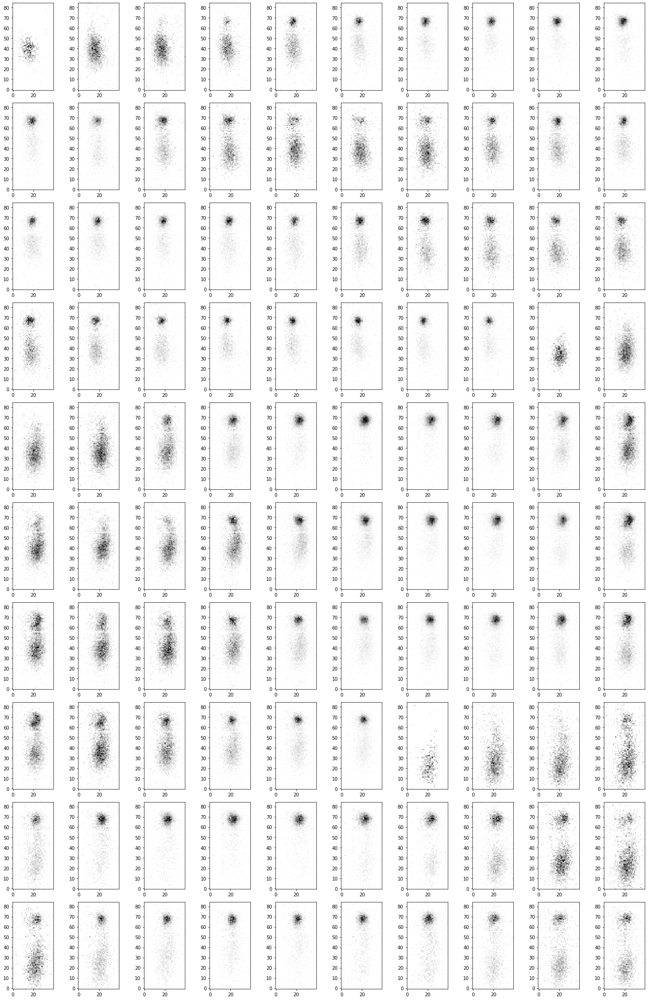

In [397]:
# checking pre_processing function
images = []
sizes = [38, 38, 24]
for i in range(3):
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds{i+1}.h5", 'r') as file:
        for j in range(sizes[i]):
            images.append(pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}'))))

fig, axs = plt.subplots(10,10, figsize=(20,30))
for i, im in enumerate(images):
    axs[i//10][i%10].imshow(im, cmap='Greys', origin='lower left')
plt.show()
    

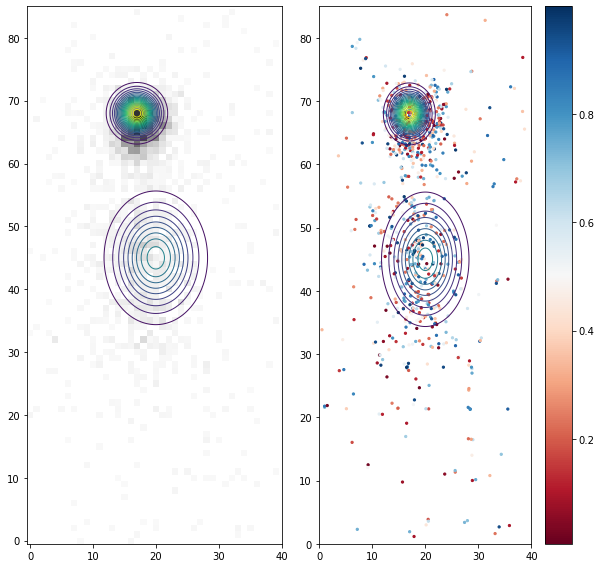

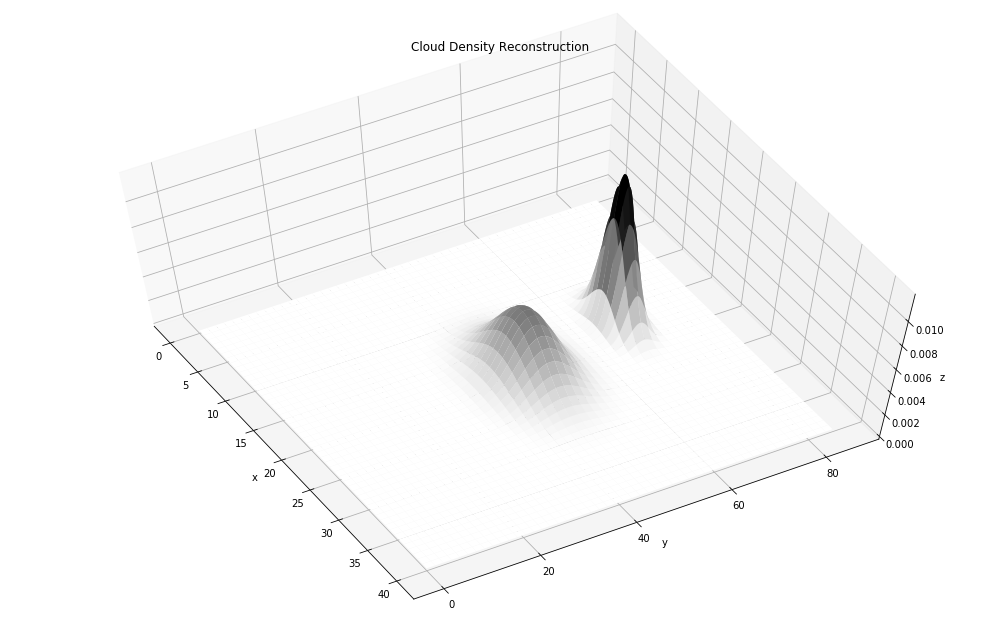

In [398]:
# checking visualize and generate data functions

data = generate_dataset(images[6], N=1000)
test_mu = np.array([[17, 68],[20, 45]])
test_phi = np.array([0.3, 0.7])
test_sigma = np.array([[[4,0],[0,4]],[[15,0],[0,25]]])
test_w = np.random.uniform(0,1,(len(data), 2))
visualize(images[6], data, test_w, test_phi, test_mu, test_sigma)

In [1094]:
def run_em(x, w, phi, mu, sigma, k=2, eps = 1e-3, max_iter = 1000):
    """
    expectation maximization algorithm for mixture of gaussian model
    x: data
    w: probability matrix
    phi: probability of belonging to a given gaussian
    mu: vector of means 
    sigma: vector of covariances
    k: number of gaussians
    eps: converence threshold
    max_iter: maximum iterations to perform
    """
    it = 0
    ll = prev_ll = None  # initialize likelhood values
    
    while it < max_iter and (prev_ll is None or np.abs(ll - prev_ll) >= eps):
        it += 1
        # update w
        for cluster_ind in range(k):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            w[:, cluster_ind] = coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term))
        w += 0.0001
        w = w/np.sum(w, axis=1, keepdims=True)  # normalize w

        # update parameters
        for cluster_ind in range(k):
            phi[cluster_ind] = np.sum(w[:,cluster_ind])/len(w)      
            mu[cluster_ind] = w[:,cluster_ind].T@x/np.sum(w[:,cluster_ind])
            sigma[cluster_ind] = ((x-mu[cluster_ind]).T@np.diag(w[:,cluster_ind])@(x-mu[cluster_ind]))/sum(w[:,cluster_ind])
        phi = phi/np.sum(phi)  # normalize phi

        # get log likelyhood to check convergence

        prob = np.zeros(len(x))
        for cluster_ind in range(k):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            prob += coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term))
        
        prev_ll = ll
        ll = np.sum(np.log(prob))
        if it % 100 == 0:
            print(str(it) + ": ll = " + str(ll))

    return w, phi, mu, sigma

def run_em_ss(x, x_tilde, z_tilde, w, phi, mu, sigma, K=2, eps = 1e-3, max_iter = 1000, alpha=20):
    n_examples_unobs, dim = x.shape
    n_examples_obs, _ = x_tilde.shape
    w_obs_matrix = np.zeros((n_examples_obs, K))
    for i in range(K):
        w_obs_matrix[:,i] = (z_tilde == i).reshape(n_examples_obs)
    it = 0
    ll = prev_ll = None
    while it < max_iter and (prev_ll is None or np.abs(ll - prev_ll) >= eps):
        for cluster_ind in range(K):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            w[:, cluster_ind] = coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term))
        w += 0.000001
        w = w/np.sum(w, axis=1, keepdims=True)  # normalize w
                # update parameters
        
        for cluster_ind in range(K):
            phi[cluster_ind] = np.sum(w[:,cluster_ind]) + alpha*np.sum(w_obs_matrix[:,cluster_ind])  
            mu[cluster_ind] = (w[:,cluster_ind].T@x + alpha* w_obs_matrix[:,cluster_ind].T@x_tilde)/(np.sum(w[:,cluster_ind])+alpha*np.sum(w_obs_matrix[:,cluster_ind]))
            sigma[cluster_ind] = ((x-mu[cluster_ind]).T@np.diag(w[:,cluster_ind])@(x-mu[cluster_ind])+alpha*(x_tilde-mu[cluster_ind]).T@np.diag(w_obs_matrix[:,cluster_ind])@(x_tilde-mu[cluster_ind]))/(sum(w[:,cluster_ind]) + alpha*sum(w_obs_matrix[:,cluster_ind]))
        phi = phi/np.sum(phi)
        # check convergence
        
        prob_unobs = np.zeros(len(x))
        prob_obs = np.zeros(len(x_tilde))
        for cluster_ind in range(K):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            mu_term_obs = x_tilde.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            prob_unobs += coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term)) 
            prob_obs +=  coeff*np.exp(np.diag(-0.5*mu_term_obs.T@sigma_term@mu_term_obs)) 
        it += 1 
        prev_ll = ll
        ll = np.sum(np.log(prob_unobs))+alpha*np.sum(np.log(prob_obs))
        if it %100 == 0:
            print(str(it) + ": ll = " + str(ll))
    alpha = 0
    for cluster_ind in range(K):
        phi[cluster_ind] = np.sum(w[:,cluster_ind]) + alpha*np.sum(w_obs_matrix[:,cluster_ind])  
        mu[cluster_ind] = (w[:,cluster_ind].T@x + alpha* w_obs_matrix[:,cluster_ind].T@x_tilde)/(np.sum(w[:,cluster_ind])+alpha*np.sum(w_obs_matrix[:,cluster_ind]))
        sigma[cluster_ind] = ((x-mu[cluster_ind]).T@np.diag(w[:,cluster_ind])@(x-mu[cluster_ind])+alpha*(x_tilde-mu[cluster_ind]).T@np.diag(w_obs_matrix[:,cluster_ind])@(x_tilde-mu[cluster_ind]))/(sum(w[:,cluster_ind]) + alpha*sum(w_obs_matrix[:,cluster_ind]))
    phi = phi/np.sum(phi)
    return w, phi, mu, sigma

def run_em_fixed_mu(x, w, phi, mu, sigma, k=2, eps = 1e-3, max_iter = 1000):
    """
    expectation maximization algorithm for mixture of gaussian model
    x: data
    w: probability matrix
    phi: probability of belonging to a given gaussian
    mu: vector of means 
    sigma: vector of covariances
    k: number of gaussians
    eps: converence threshold
    max_iter: maximum iterations to perform
    """
    it = 0
    ll = prev_ll = None  # initialize likelhood values
    
    while it < max_iter and (prev_ll is None or np.abs(ll - prev_ll) >= eps):
        it += 1
        # update w
        for cluster_ind in range(k):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            w[:, cluster_ind] = coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term))

        w = w/np.sum(w, axis=1, keepdims=True)  # normalize w
        # update parameters
        for cluster_ind in range(k):
            phi[cluster_ind] = np.sum(w[:,cluster_ind])/len(w)      
#             mu[cluster_ind] = w[:,cluster_ind].T@x/np.sum(w[:,cluster_ind])
            sigma[cluster_ind] = ((x-mu[cluster_ind]).T@np.diag(w[:,cluster_ind])@(x-mu[cluster_ind]))/(sum(w[:,cluster_ind]))
        phi = phi/np.sum(phi)  # normalize phi

        # get log likelyhood to check convergence

        prob = np.zeros(len(x))
        for cluster_ind in range(k):
            coeff = phi[cluster_ind]/(2*np.pi)**(x.shape[1]/2)/np.sqrt(np.linalg.det(sigma[cluster_ind]))
            mu_term = x.T - mu[cluster_ind:cluster_ind+1,:].T
            sigma_term =np.linalg.pinv(sigma[cluster_ind])
            prob += coeff*np.exp(np.diag(-0.5*mu_term.T@sigma_term@mu_term))
        
        prev_ll = ll
        ll = np.sum(np.log(prob))
        if it % 100 == 0:
            print(str(it) + ": ll = " + str(ll))

    return w, phi, mu, sigma
def main(x, K=2, seed=True, semi_supervised=False, alpha=20, fixed_mu = False):
    if seed:
        random.seed(0)
#     print('Running EM algorithm...')
    w, phi, mu, sigma = initialize_params(x, K)

    bluex = np.linspace(10,25, 5)
    bluey = np.linspace(25, 55, 5)

    redx = np.linspace(15, 25, 5)
    redy = np.linspace(63, 70, 5)


    x_tilde = np.zeros((50,2))
    z_tilde = np.zeros(50)
    it = 0
    for row in bluex:
        for col in bluey:
            x_tilde[it,:] = [row,col]
            z_tilde[it] = 0
            it += 1
    for row in redx:
        for col in redy:
            x_tilde[it,:] = [row,col]
            z_tilde[it] = 1
            it += 1
    
    if fixed_mu:
        return run_em_fixed_mu(x, w, phi, mu, sigma)
    if semi_supervised:
        return run_em_ss(x, x_tilde, z_tilde, w, phi, mu, sigma, alpha=alpha)
    return run_em(x, w, phi, mu, sigma)


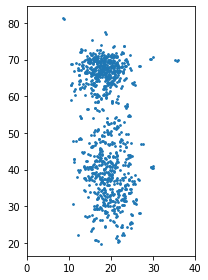

In [750]:
# testing all together

images = []
sizes = [38, 38, 24]
for i in range(3):
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds{i+1}.h5", 'r') as file:
        for j in range(sizes[i]):
            images.append(pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}')), cutoff=50))

im = images[12]
data = generate_dataset(im, seed=False)
fig, axe = plt.subplots(1, figsize=(3,4))
axe.scatter(data[:,0], data[:,1], s=3)
plt.xlim(0,40)
plt.show()
# w, phi, mu, sigma = main(data, seed=False)
# visualize(im, data, w, phi, mu, sigma)

In [440]:
# example animation

images = []
size = 38
cutoff = 50
frame_nums = (2,38)
points = 200
name = 'RabiFlopping'

with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    for j in range(size):
        images.append(pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}')), cutoff=cutoff))

x = np.linspace(0, upperb_y-lowerb_y, points) 
y = np.linspace(0, upperb_x-lowerb_x, points)
X,Y = np.meshgrid(x, y)
pos  = np.dstack((X, Y))
zarray = np.zeros((points, points, frame_nums[1]-frame_nums[0]))


for i in range(frame_nums[1]-frame_nums[0]):
    data = generate_dataset(images[i+frame_nums[0]], seed=False)
    w, phi, mu, sigma = main(data, seed=False)
    Z = sum([phi[i]*multivariate_normal(mu[i], sigma[i]).pdf(pos) for i in range(len(mu))])
    zarray[:,:,i] = Z
    
for i in range(frame_nums[1]- frame_nums[0]):
    fig = plt.figure(figsize=(14,9))
    ax = plt.axes(projection='3d')
    ax.view_init(65, -30)
    ax.plot_surface(X,Y,zarray[:,:,i], cmap='Blues')
    ax.set_xlabel('x', fontsize=15)
    ax.set_ylabel('y', fontsize=15)
    ax.set_zlabel('Probability', fontsize=15)
    ax.set_xlim(0,40)
    ax.set_ylim(0,80)
    ax.set_zlim(0, 0.01)
    ax.set_title('Rabi Flopping between |1S0> and |3P1>', fontsize=20)
    plt.savefig(f"{name}{i}.png")
    plt.close()
    

frames = [Image.open(frame) for frame in get_frames(name)]
frames[0].save(f"{name}.gif", format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

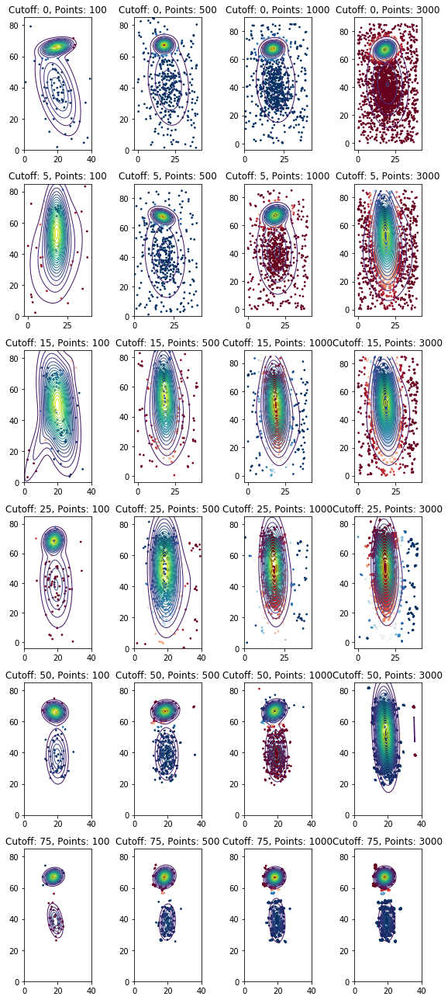

In [521]:
# parameters to test
cutoff = 25
points = 1000
threshold = 1e-3
lowerb_x, upperb_x, lowerb_y, upperb_y = bounds = (80, 165, 50, 90)
seed = False
uniform_dist = True
K = 2
max_iter = 1000 # dont think i ever hit that

# I think that only things that will have significant effects are cutoff, points, uniform dist, and K


x = np.linspace(0, upperb_y-lowerb_y, points) 
y = np.linspace(0, upperb_x-lowerb_x, points)

X,Y = np.meshgrid(x, y)
pos  = np.dstack((X, Y))

cutoffs = [0,5,15,25,50,75]
point_num = [100,500,1000,3000]

ind = 12
      
fig, axe = plt.subplots(len(cutoffs),len(point_num), figsize=(2*len(point_num), 3*len(cutoffs)))

row = -1
col = -1
for co in cutoffs:
    col += 1
    row = -1
    for p in point_num:
        row += 1
        images = []
        with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
            for pic in range(38):
                images.append(pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{pic}')), cutoff=co))
        
        data = generate_dataset(images[ind], seed=False, N=p)
        w, phi, mu, sigma = main(data, seed=False)
        Z = sum([phi[k]*multivariate_normal(mu[k], sigma[k]).pdf(pos) for k in range(len(mu))])
        axe[col][row].contour(X, Y, Z, levels=20, linewidths=1)
        axe[col][row].scatter(data[:,0], data[:,1], s=3, c=w[:,0], cmap='RdBu')
        axe[col][row].set_title(f"Cutoff: {co}, Points: {p}")
plt.show()


In [471]:
# semi supervised approach
# add in a data point at a known location with weight alpha

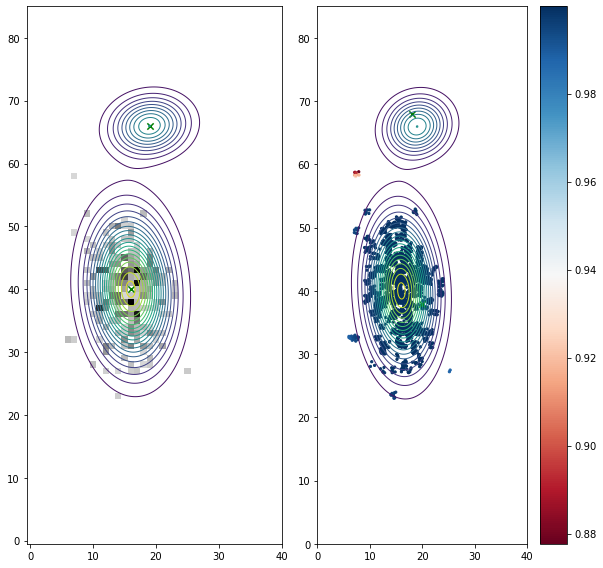

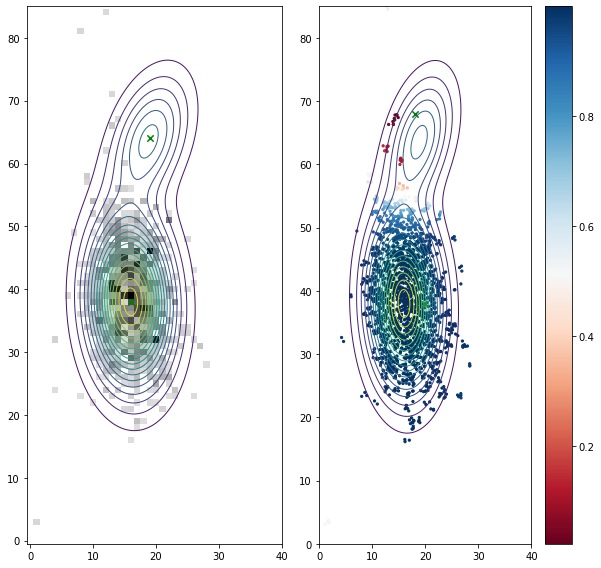

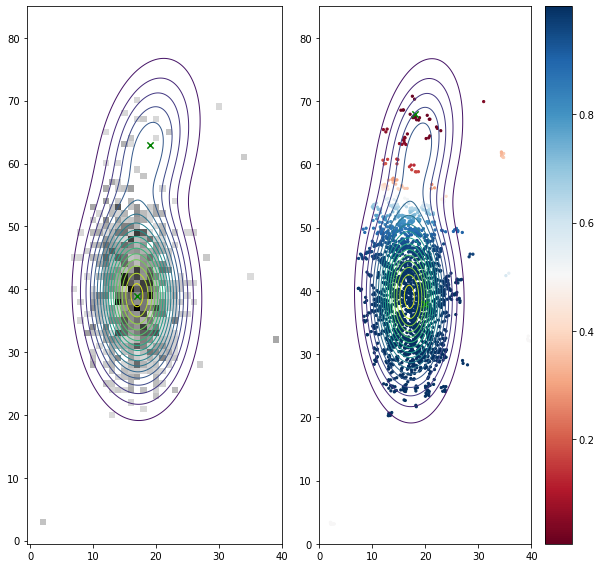

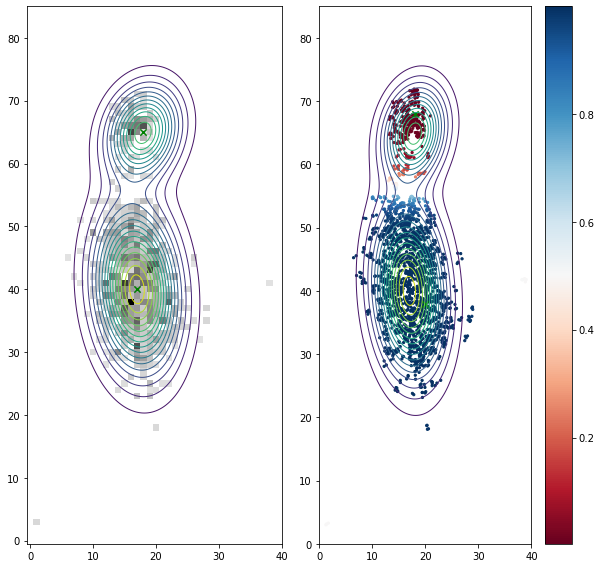

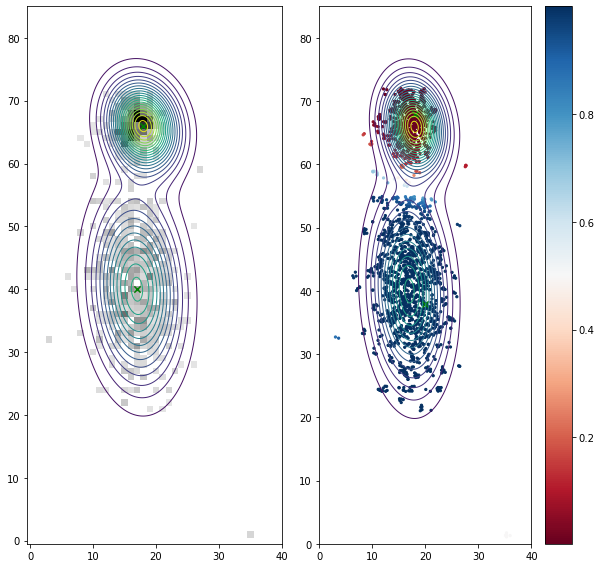

...

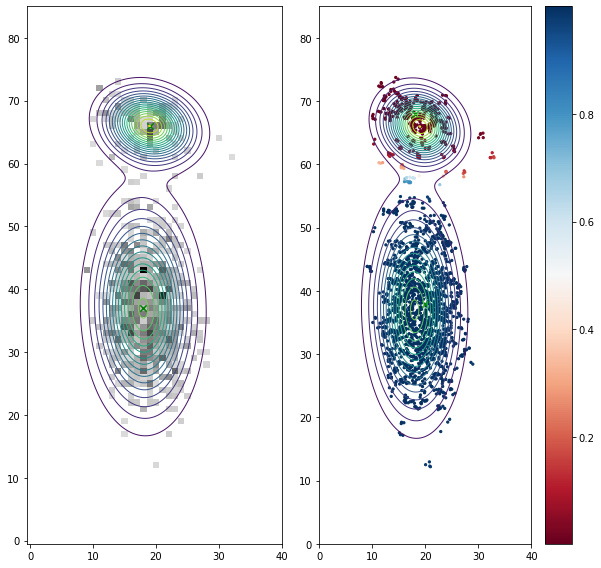

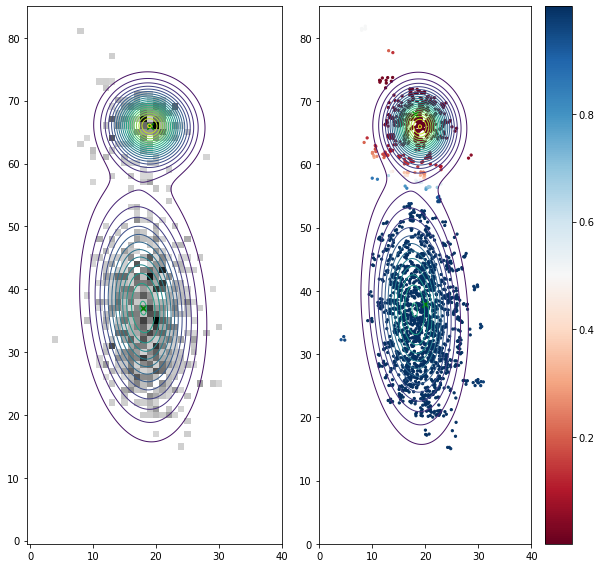

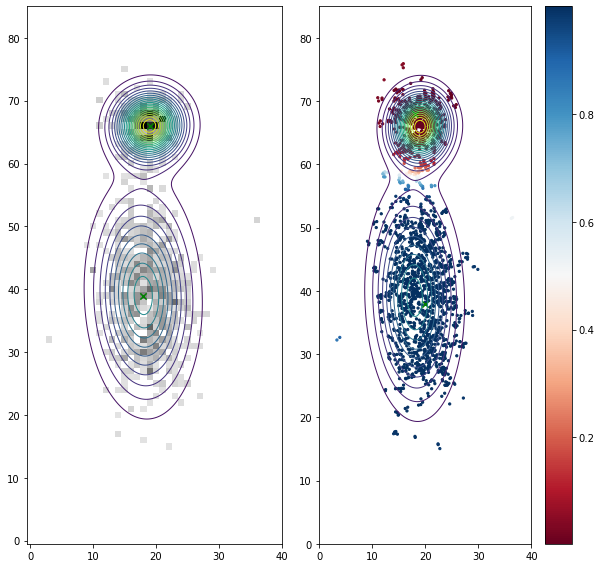

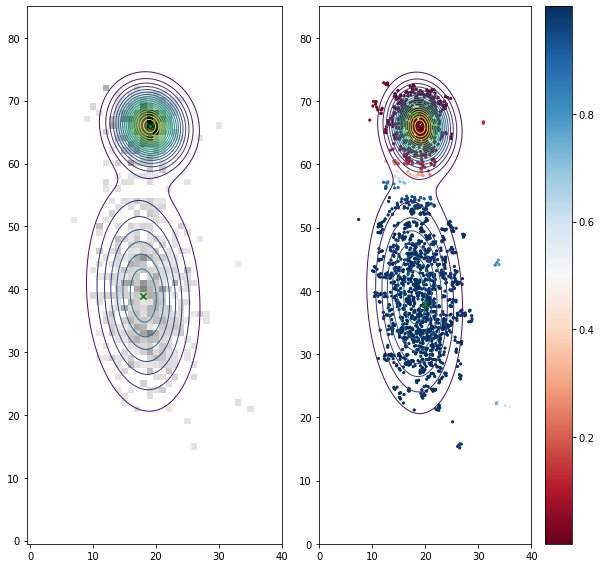

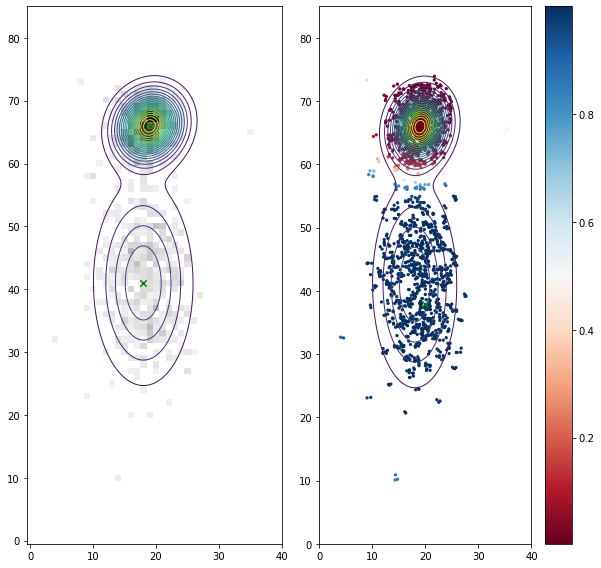

In [719]:
# testing all together
rabi1 = np.zeros((20, 2))
rabi2 = np.zeros((20,2))
images = []
sizes = [38, 38, 24]
for i in range(3):
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds{i+1}.h5", 'r') as file:
        for j in range(sizes[i]):
            images.append(pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}')), cutoff=50))
for i in range(20):
    im = images[i]
    data = generate_dataset(im, seed=False, N=2000)
    w, phi, mu, sigma = main(data, seed=False, semi_supervised=True, alpha=20)
    rabi1[i,:] = phi
    rabi2[i,:] = list(naive_phi(1, i))
    visualize(im, data, w, phi, mu, sigma, threeD=False)

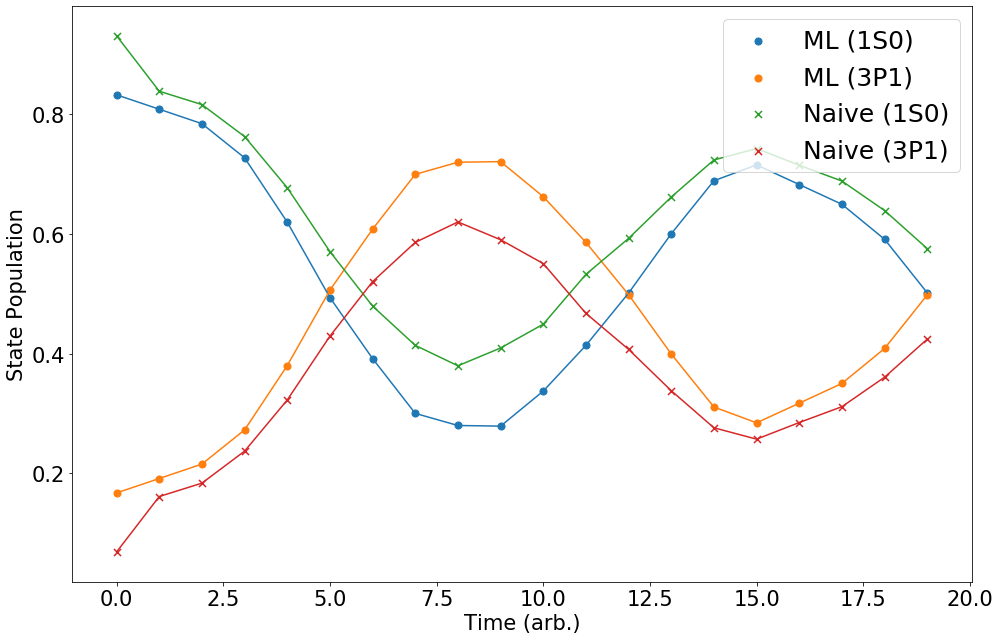

In [769]:
plt.scatter(np.arange(len(rabi1)), rabi1[:,0], label = 'ML (1S0)', s=50)
plt.scatter(np.arange(len(rabi1)), rabi1[:,1], label = 'ML (3P1)', s=50)
plt.scatter(np.arange(len(rabi1)), rabi2[:,0], label = 'Naive (1S0)', s=50, marker='x')
plt.scatter(np.arange(len(rabi1)), rabi2[:,1], label = 'Naive (3P1)', s=50, marker='x')
plt.plot(rabi1)
plt.plot(rabi2)
# plt.plot(rabi2, '-', lw=4, label='Naive')
plt.xticks(fontsize=21)
plt.yticks(fontsize=21)
plt.ylabel("State Population", fontsize=21)
plt.xlabel('Time (arb.)', fontsize=21)
plt.legend(loc='upper right', fontsize=25)
plt.show()

New ideas to try:

First off, lets try a bunch of different filtering techniques
    threshold
    gaussian
    median
    morphological filters
    non local means denoising
    
    
new clustering ideas:
    k means clustering
    PCA
    ICA
    GAN

In [820]:
def threshold(image, cutoff):
    return np.where(image< cutoff, 0, image)

def median_filter(image, size):
    assert size%2 == 1
    out = np.zeros(image.shape)
    for row in range(len(image)):
        for col in range(len(image[0])):
            xs = np.arange(col-size//2, col+size//2 +1)
            ys = np.arange(row-size//2, row+size//2 +1)
            vals = []
            for x in xs:
                for y in ys:
                    if x < 0 or y < 0:
                        continue
                    if x >= len(image[0]) or y >= len(image):
                        continue
                    vals.append(image[y, x])
            out[row, col] = np.median(vals)
    return out

def gkern(l=5, sig=1.):
    """\
    creates gaussian kernel with side length `l` and a sigma of `sig`
    """
    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sig))
    kernel = np.outer(gauss, gauss)
    return kernel / np.sum(kernel)

def gaussian_filter(image, l, sigma ):
    assert l%2==1
    kern = gkern(l, sigma)
    
    out = np.zeros(image.shape)
    
    for row in range(len(image)):
        for col in range(len(image[0])):
            xs = np.arange(col-l//2, col+l//2 +1)
            ys = np.arange(row-l//2, row+l//2 +1)
            val = 0
            for i, x in enumerate(xs):
                for j, y in enumerate(ys):
                    if x < 0 or y < 0:
                        continue
                    if x >= len(image[0]) or y >= len(image):
                        continue
                    val += image[y, x]*kern[i, j]
            out[row, col] = val
    return out


In [836]:
 with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image0')), cutoff=0)
    

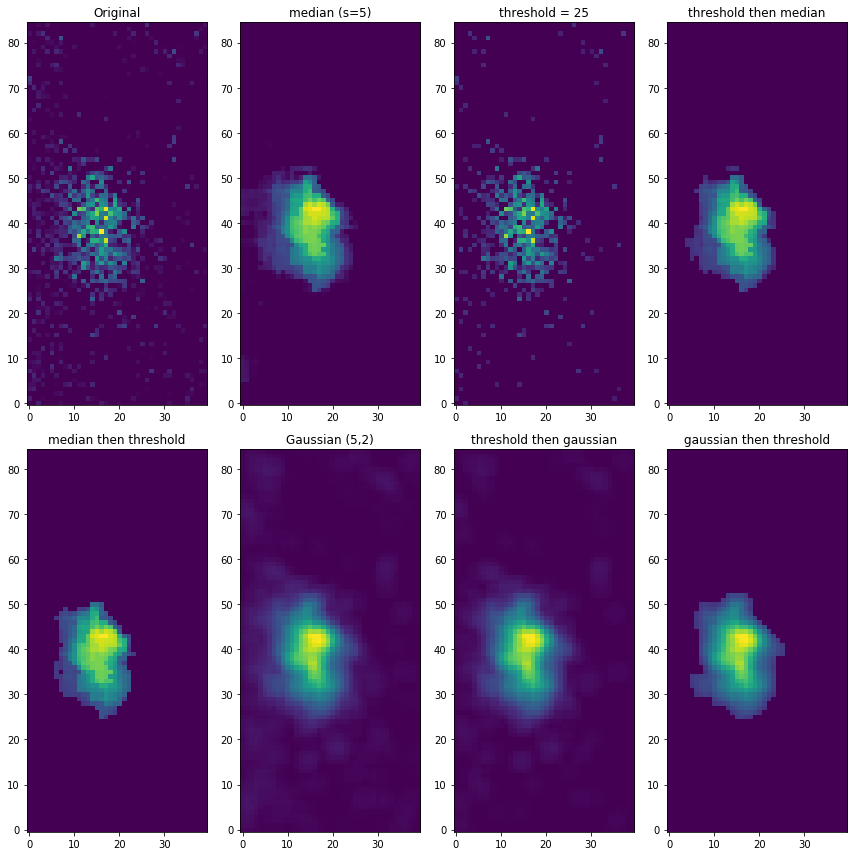

In [840]:
fig, axe = plt.subplots(2,4, figsize=(12,12))
axe[0][0].imshow(im, origin='lower left')
axe[0][0].set_title('Original')
axe[0][1].imshow(median_filter(im, 5), origin='lower left')
axe[0][1].set_title('median (s=5)')
axe[0][2].imshow(threshold(im, 15), origin='lower left')
axe[0][2].set_title('threshold = 25')
axe[0][3].imshow(median_filter(threshold(im, 10), 5), origin='lower left')
axe[0][3].set_title('threshold then median')
axe[1][0].imshow(threshold(median_filter(im, 5), 15), origin='lower left')
axe[1][0].set_title('median then threshold')

axe[1][1].imshow(gaussian_filter(im, 5, 2), origin='lower left')
axe[1][1].set_title("Gaussian (5,2)")
axe[1][2].imshow(gaussian_filter(threshold(im, 15), 5, 2),  origin='lower left')
axe[1][2].set_title("threshold then gaussian")
axe[1][3].imshow(threshold(gaussian_filter(im, 5, 2), 15), origin='lower left')
axe[1][3].set_title("gaussian then threshold")


plt.show()

In [889]:
def test_filter(cloud_num, semi_supervised=False, alpha=20, cutoff=25, gaussian=False, median=False, threshold_first=True, num=38, median_size=5, gaussian_size=5, gaussian_sigma=1., N=1000, seed=False):
    output = np.zeros((num, 2))  
    images = []
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds{cloud_num}.h5", 'r') as file:
        for j in range(num):
#             print(f"Processing Image {j}")
            im = np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}'))
            lowerb_x, upperb_x, lowerb_y, upperb_y = bounds = (80, 165, 50, 90)
    
            im = im[lowerb_x:upperb_x, lowerb_y:upperb_y] # crop
            im = np.where(im == 300, 0, im) # take out frame
            if threshold_first:
                im = threshold(im, cutoff)
            if gaussian:
                im = gaussian_filter(im, gaussian_size, gaussian_sigma)
            if median:
                im = median_filter(im, median_size)
            if not threshold_first:
                im = threshold(im, cutoff)                
            images.append(im)
            
            
    for i in range(num):
        if i%5 ==0:
            print(f"Running Algorithm on Image {i}")
        data = generate_dataset(images[i], seed=seed, N=N)
        w, phi, mu, sigma = main(data, seed=seed, semi_supervised=semi_supervised, alpha=alpha)
        output[i,0] = phi[0]
        output[i,1] = list(naive_phi(cloud_num, i))[0]
    print('DONE...\n\n')
    return output
#         visualize(images[i], data, w, phi, mu, sigma, threeD=False)
        
#     plt.scatter(np.arange(len(rabi1)), rabi1[:,0], label = 'ML (1S0)', s=50)
#     plt.scatter(np.arange(len(rabi1)), rabi1[:,1], label = 'ML (3P1)', s=50)
#     plt.scatter(np.arange(len(rabi1)), rabi2[:,0], label = 'Naive (1S0)', s=50, marker='x')
#     plt.scatter(np.arange(len(rabi1)), rabi2[:,1], label = 'Naive (3P1)', s=50, marker='x')
#     plt.plot(rabi1)
#     plt.plot(rabi2)
#     plt.xticks(fontsize=21)
#     plt.yticks(fontsize=21)
#     plt.ylabel("State Population", fontsize=21)
#     plt.xlabel('Time (arb.)', fontsize=21)
#     plt.legend(loc='upper right', fontsize=25)
#     plt.show()


Processing Image 0
Processing Image 1
Processing Image 2
Processing Image 3
Processing Image 4
Processing Image 5
Processing Image 6
Processing Image 7
Processing Image 8
Processing Image 9
Processing Image 10
Processing Image 11
Processing Image 12
Processing Image 13
Processing Image 14
Processing Image 15
Processing Image 16
Processing Image 17
Processing Image 18
Processing Image 19
Running Algorithm on Image 0


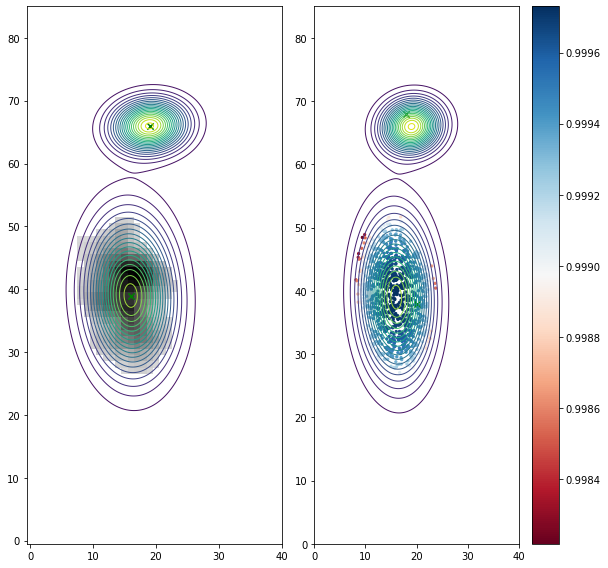

Running Algorithm on Image 1


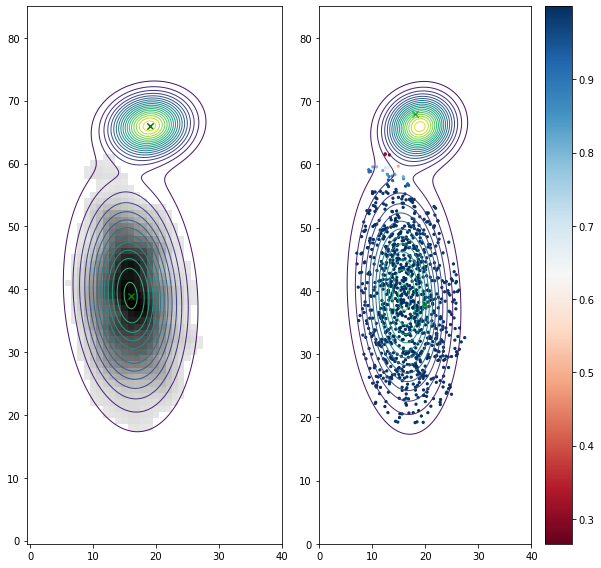

Running Algorithm on Image 2


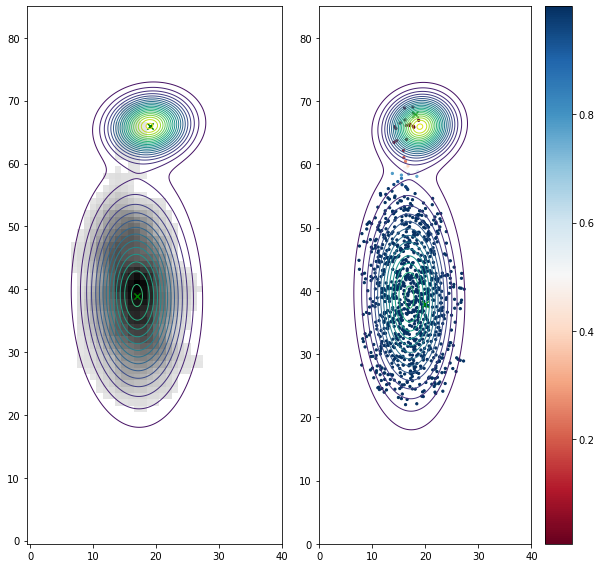

Running Algorithm on Image 3


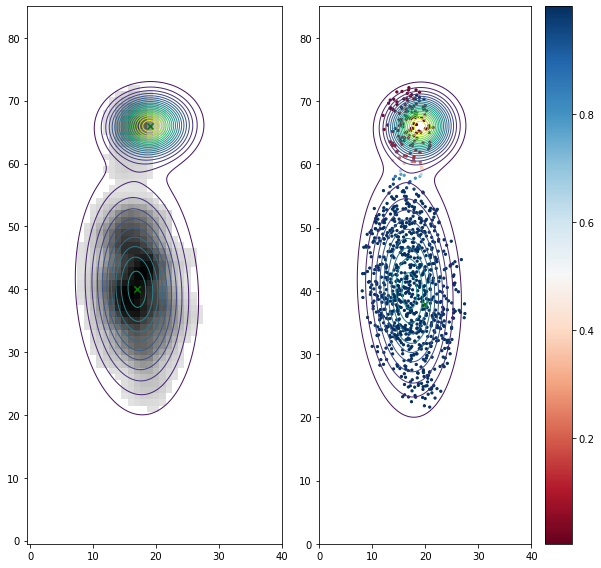

Running Algorithm on Image 4


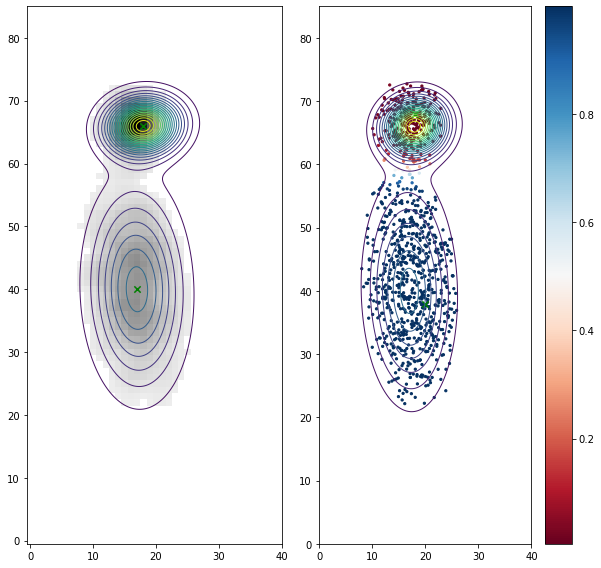

Running Algorithm on Image 5


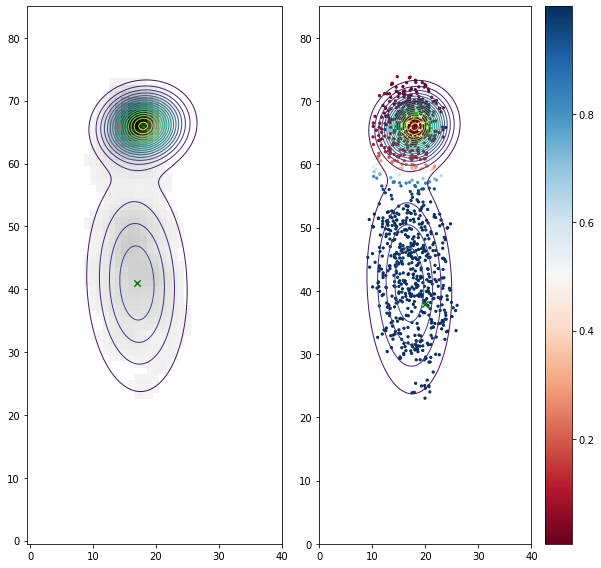

Running Algorithm on Image 6


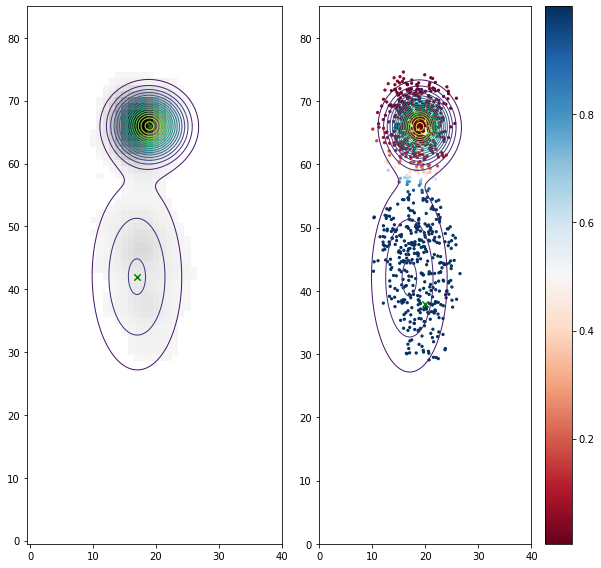

Running Algorithm on Image 7


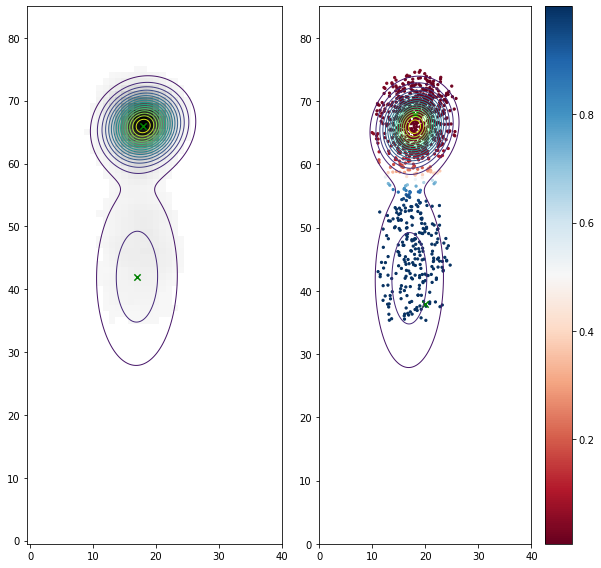

Running Algorithm on Image 8


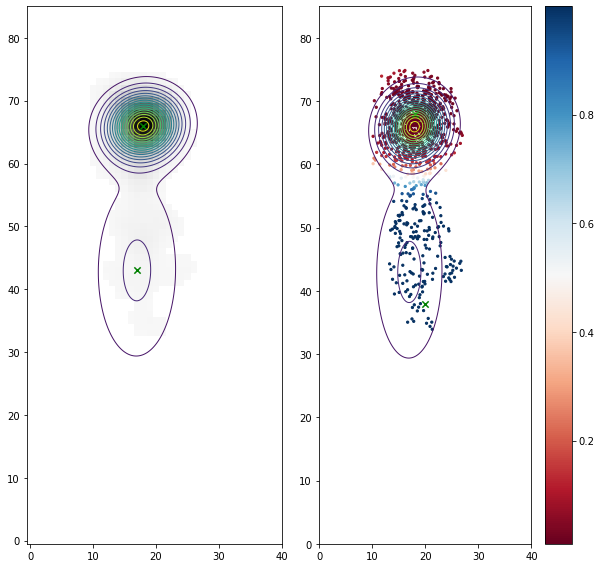

Running Algorithm on Image 9


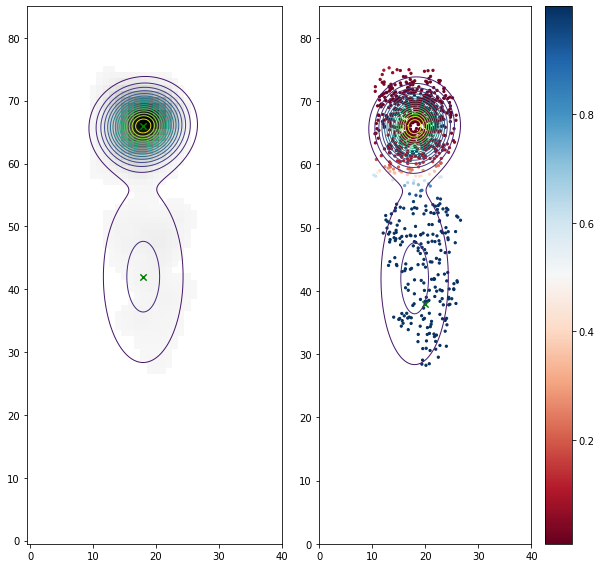

Running Algorithm on Image 10


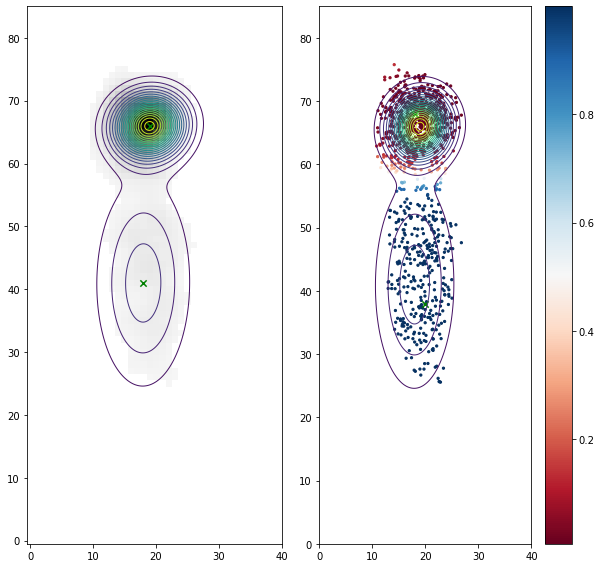

Running Algorithm on Image 11


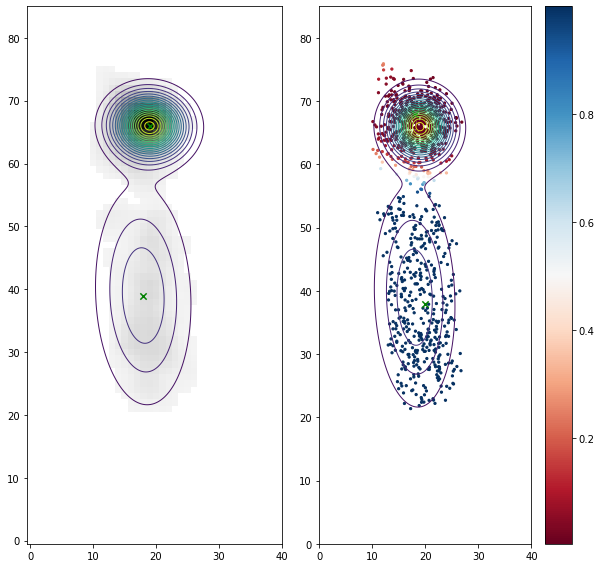

Running Algorithm on Image 12


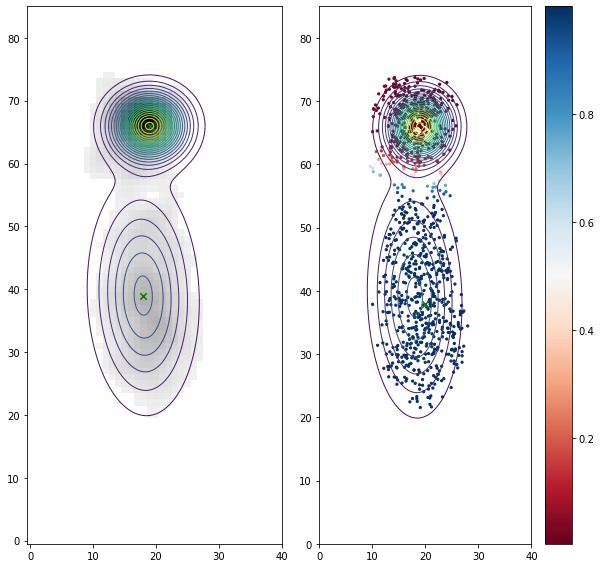

Running Algorithm on Image 13


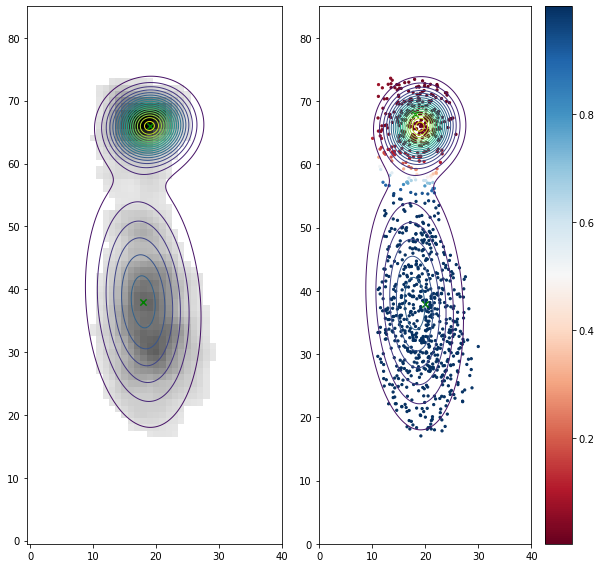

Running Algorithm on Image 14


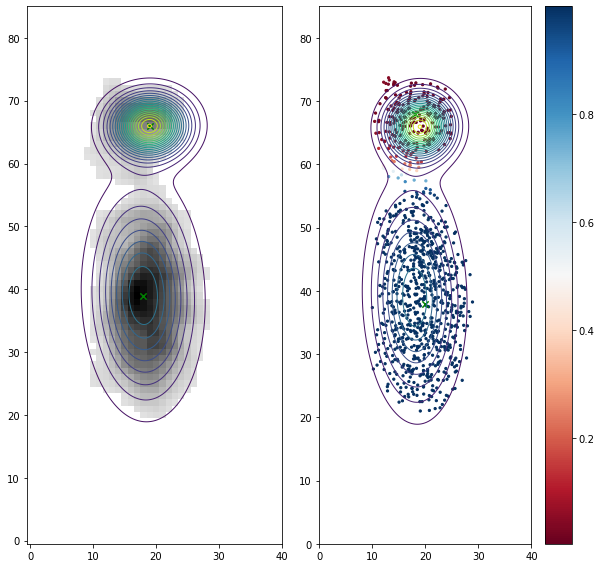

Running Algorithm on Image 15


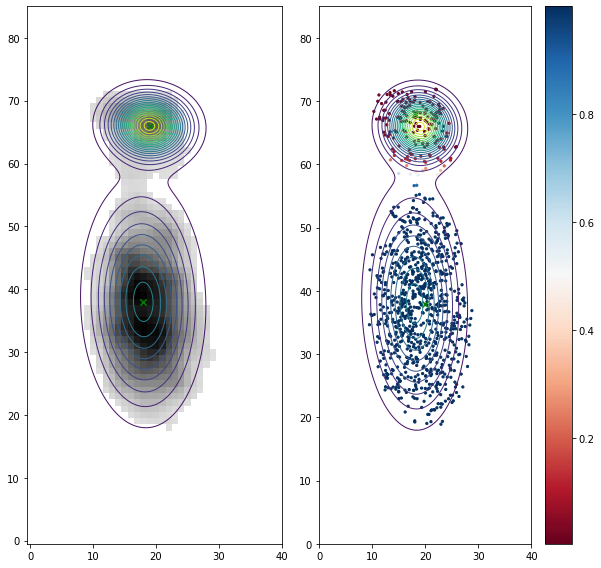

Running Algorithm on Image 16


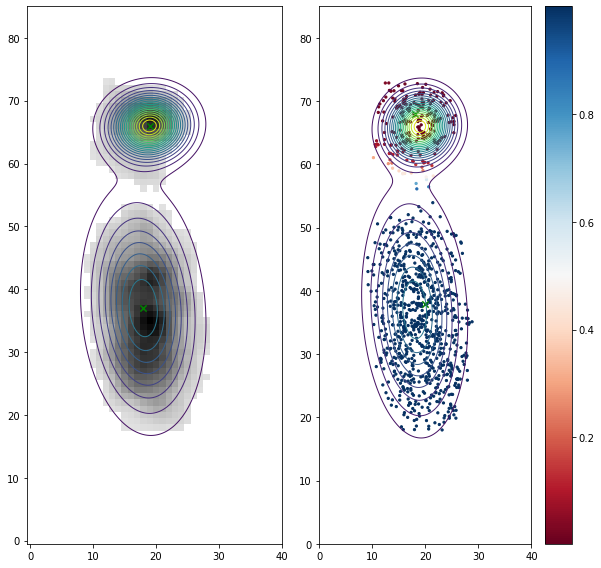

Running Algorithm on Image 17


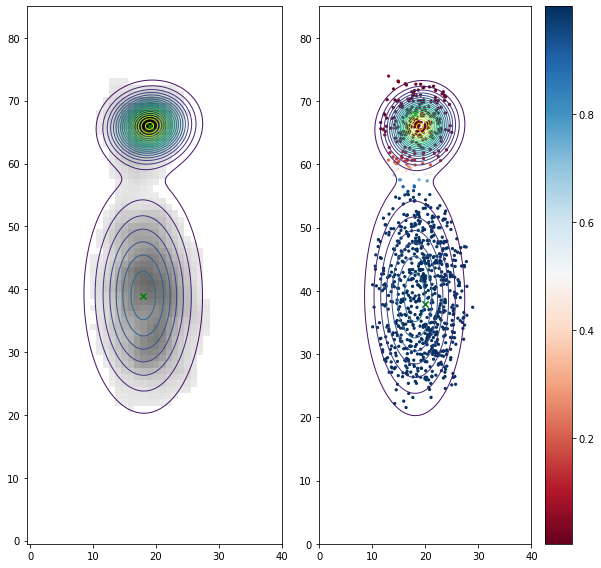

Running Algorithm on Image 18


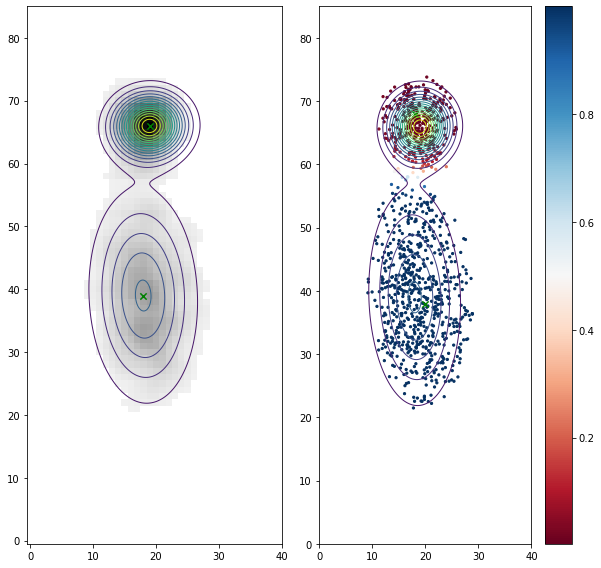

Running Algorithm on Image 19


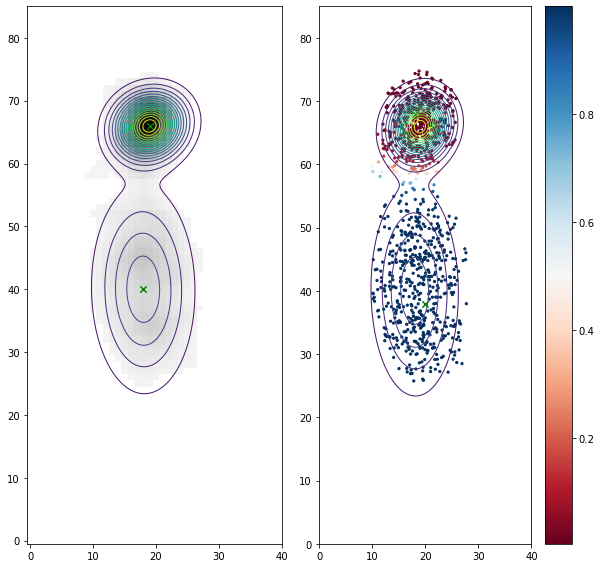

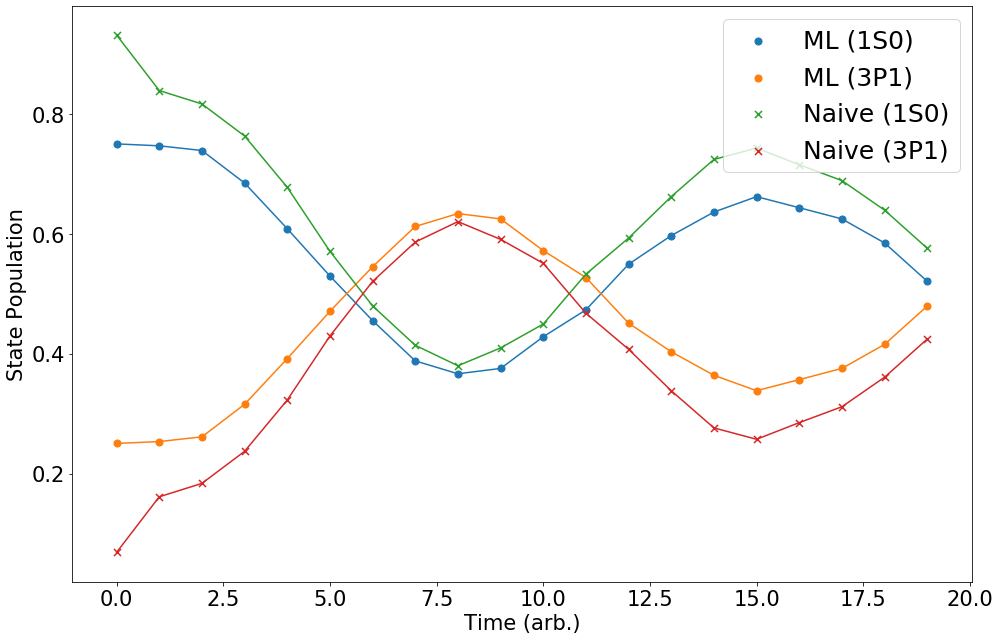

In [855]:
test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20)

Generating Frame 0
Generating Frame 10
Generating Frame 20
Generating Frame 30


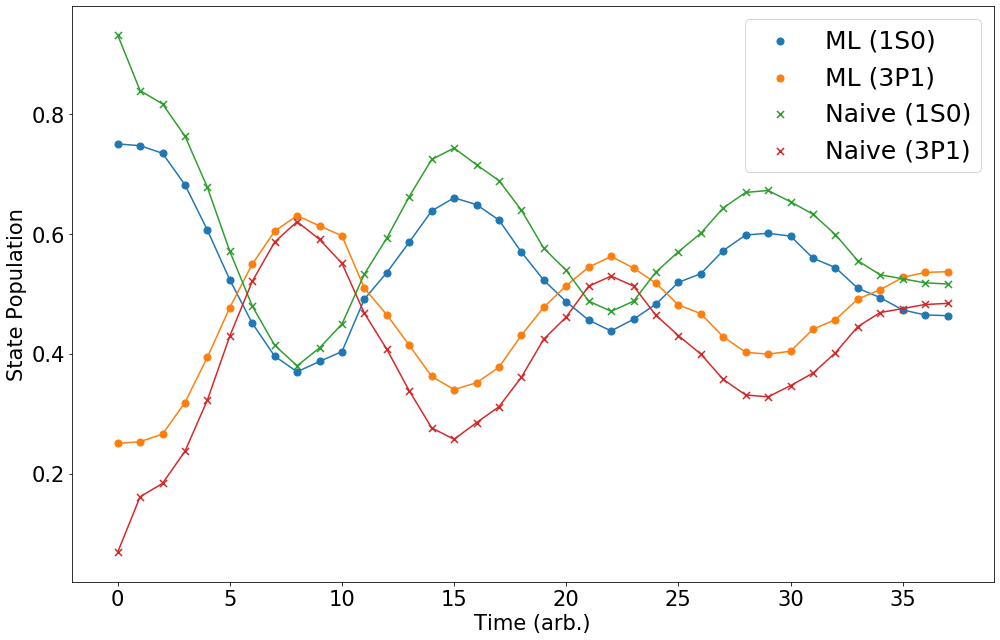

In [863]:
# Animation with improved performance
rabi1 = np.zeros((38, 2))
rabi2 = np.zeros((38, 2))
images = []
size = 38
cutoff = 25
frame_num = 38
points = 300
name = 'RabiFloppingBetter'
gaussian = True
median = False
threshold_first=False
gaussian_size=5
gaussian_sigma=2

with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    for j in range(size):
        im = np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}'))
        lowerb_x, upperb_x, lowerb_y, upperb_y = bounds = (80, 165, 50, 90)

        im = im[lowerb_x:upperb_x, lowerb_y:upperb_y] # crop
        im = np.where(im == 300, 0, im) # take out frame
        if threshold_first:
            im = threshold(im, cutoff)
        if gaussian:
            im = gaussian_filter(im, gaussian_size, gaussian_sigma)
        if not threshold_first:
            im = threshold(im, cutoff)                
        images.append(im)
        
        
x = np.linspace(0, upperb_y-lowerb_y, points) 
y = np.linspace(0, upperb_x-lowerb_x, points)
X,Y = np.meshgrid(x, y)
pos  = np.dstack((X, Y))
zarray = np.zeros((points, points,frame_num))


for i in range(frame_num):
    if i % 10 == 0:
        print(f"Generating Frame {i}")
    data = generate_dataset(images[i], seed=False, N=1000)
    w, phi, mu, sigma = main(data, seed=False, semi_supervised=True, alpha=20)
    rabi1[i,:] = phi
    rabi2[i,:] = list(naive_phi(1, i))
    Z = sum([phi[i]*multivariate_normal(mu[i], sigma[i]).pdf(pos) for i in range(len(mu))])
    zarray[:,:,i] = Z
plt.scatter(np.arange(len(rabi1)), rabi1[:,0], label = 'ML (1S0)', s=50)
plt.scatter(np.arange(len(rabi1)), rabi1[:,1], label = 'ML (3P1)', s=50)
plt.scatter(np.arange(len(rabi1)), rabi2[:,0], label = 'Naive (1S0)', s=50, marker='x')
plt.scatter(np.arange(len(rabi1)), rabi2[:,1], label = 'Naive (3P1)', s=50, marker='x')
plt.plot(rabi1)
plt.plot(rabi2)
plt.xticks(fontsize=21)
plt.yticks(fontsize=21)
plt.ylabel("State Population", fontsize=21)
plt.xlabel('Time (arb.)', fontsize=21)
plt.legend(loc='upper right', fontsize=25)
plt.show()   

for i in range(frame_num):
    fig = plt.figure(figsize=(14,9))
    ax = plt.axes(projection='3d')
    ax.view_init(65, -30)
    ax.plot_surface(X,Y,zarray[:,:,i], cmap='Blues')
    ax.set_xlabel('x', fontsize=15)
    ax.set_ylabel('y', fontsize=15)
    ax.set_zlabel('Probability', fontsize=15)
    ax.set_xlim(0,40)
    ax.set_ylim(0,80)
    ax.set_zlim(0, 0.01)
    ax.set_title('Rabi Flopping between |1S0> and |3P1>', fontsize=20)
    plt.savefig(f"{name}{i}.png")
    plt.close()
    

frames = [Image.open(frame) for frame in get_frames(name)]
frames[0].save(f"{name}.gif", format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

In [860]:
for i in range(frame_num):
    fig = plt.figure(figsize=(14,9))
    ax = plt.axes(projection='3d')
    ax.view_init(65, -30)
    ax.plot_surface(X,Y,zarray[:,:,i], cmap='Blues')
    ax.set_xlabel('x', fontsize=15)
    ax.set_ylabel('y', fontsize=15)
    ax.set_zlabel('Probability', fontsize=15)
    ax.set_xlim(0,40)
    ax.set_ylim(0,80)
    ax.set_zlim(0, 0.01)
    ax.set_title('Rabi Flopping between |1S0> and |3P1>', fontsize=20)
    plt.savefig(f"{name}{i}.png")
    plt.close()
    

frames = [Image.open(frame) for frame in get_frames(name)]
frames[0].save(f"{name}.gif", format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

In [893]:
# med_3_no_cutoff = test_filter(1, semi_supervised=True, cutoff=0, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
# med_7_no_cutoff = test_filter(1, semi_supervised=True, cutoff=0, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
# med_11_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
# gauss_3_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=3)
# gauss_7_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=37)
# gauss_11_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=11)

# med_3_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
# med_7_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
# med_11_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
# gauss_3_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
# gauss_7_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
# gauss_11_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

# med_3_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
# med_7_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
# med_11_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
# gauss_3_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
# gauss_7_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
# gauss_11_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

# med_3_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
# med_7_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
# med_11_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
# gauss_3_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
# gauss_7_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

med_3_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=3)
med_7_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=7)
med_11_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=11)
gauss_3_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True,  threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=3)
gauss_7_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=11)

Running Algorithm on Image 0
Running Algorithm on Image 5
Running Algorithm on Image 10
Running Algorithm on Image 15
Running Algorithm on Image 20
Running Algorithm on Image 25
Running Algorithm on Image 30
Running Algorithm on Image 35
DONE...


Running Algorithm on Image 0
Running Algorithm on Image 5
Running Algorithm on Image 10
Running Algorithm on Image 15
Running Algorithm on Image 20
Running Algorithm on Image 25
Running Algorithm on Image 30
Running Algorithm on Image 35
DONE...


Running Algorithm on Image 0
Running Algorithm on Image 5
Running Algorithm on Image 10
Running Algorithm on Image 15
Running Algorithm on Image 20
Running Algorithm on Image 25
Running Algorithm on Image 30
Running Algorithm on Image 35
DONE...


Running Algorithm on Image 0
Running Algorithm on Image 5
Running Algorithm on Image 10
Running Algorithm on Image 15
Running Algorithm on Image 20
Running Algorithm on Image 25
Running Algorithm on Image 30
Running Algorithm on Image 35
DONE...


Running 

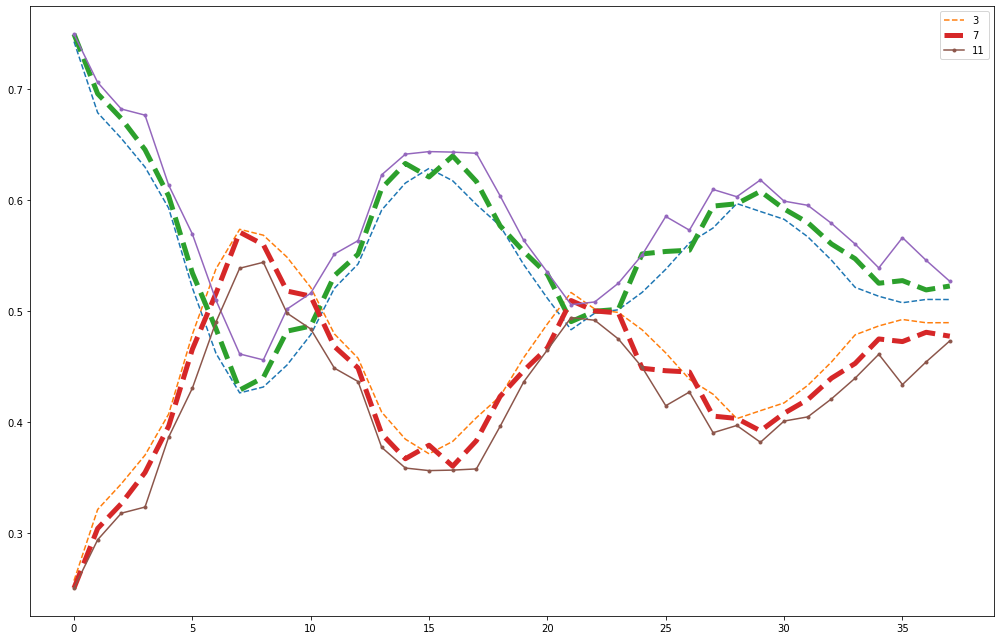

In [888]:
med_3_no_cutoff = test_filter(1, semi_supervised=True, cutoff=0, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
med_7_no_cutoff = test_filter(1, semi_supervised=True, cutoff=0, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
med_11_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
gauss_3_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=3)
gauss_7_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=37)
gauss_11_no_cutoff= test_filter(1, semi_supervised=True, cutoff=0, gaussian=True, threshold_first=False, gaussian_sigma=2, num=20, gaussian_size=11)

med_3_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
med_7_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
med_11_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
gauss_3_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
gauss_7_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_10= test_filter(1, semi_supervised=True, cutoff=10, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

med_3_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
med_7_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
med_11_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
gauss_3_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
gauss_7_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_25= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

med_3_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=3)
med_7_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False, median=True, threshold_first=False, gaussian_sigma=2, num=38, median_size=7)
med_11_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=False,median=True,  threshold_first=False, gaussian_sigma=2, num=38, median_size=11)
gauss_3_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=3)
gauss_7_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_50= test_filter(1, semi_supervised=True, cutoff=50, gaussian=True, threshold_first=False, gaussian_sigma=2, num=38, gaussian_size=11)

med_3_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=3)
med_7_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=7)
med_11_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=False,median=True,  threshold_first=True, gaussian_sigma=2, num=38, median_size=11)
gauss_3_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True,  threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=3)
gauss_7_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=7)
gauss_11_cutoff_25_rev= test_filter(1, semi_supervised=True, cutoff=25, gaussian=True, threshold_first=True, gaussian_sigma=2, num=38, gaussian_size=11)

In [905]:
med = np.array([[med_3_no_cutoff,med_7_no_cutoff,med_11_no_cutoff],
               [med_3_cutoff_10,med_7_cutoff_10,med_11_cutoff_10],
               [med_3_cutoff_25,med_7_cutoff_25,med_11_cutoff_25],
               [med_3_cutoff_50,med_7_cutoff_50,med_11_cutoff_50],
               [med_3_cutoff_25_rev,med_7_cutoff_25_rev,med_11_cutoff_25_rev]])
gau = np.array([[gauss_3_no_cutoff,gauss_7_no_cutoff,gauss_11_no_cutoff],
               [gauss_3_cutoff_10,gauss_7_cutoff_10,gauss_11_cutoff_10],
               [gauss_3_cutoff_25,gauss_7_cutoff_25,gauss_11_cutoff_25],
               [gauss_3_cutoff_50,gauss_7_cutoff_50,gauss_11_cutoff_50],
               [gauss_3_cutoff_25_rev,gauss_7_cutoff_25_rev,gauss_11_cutoff_25_rev]])

[]

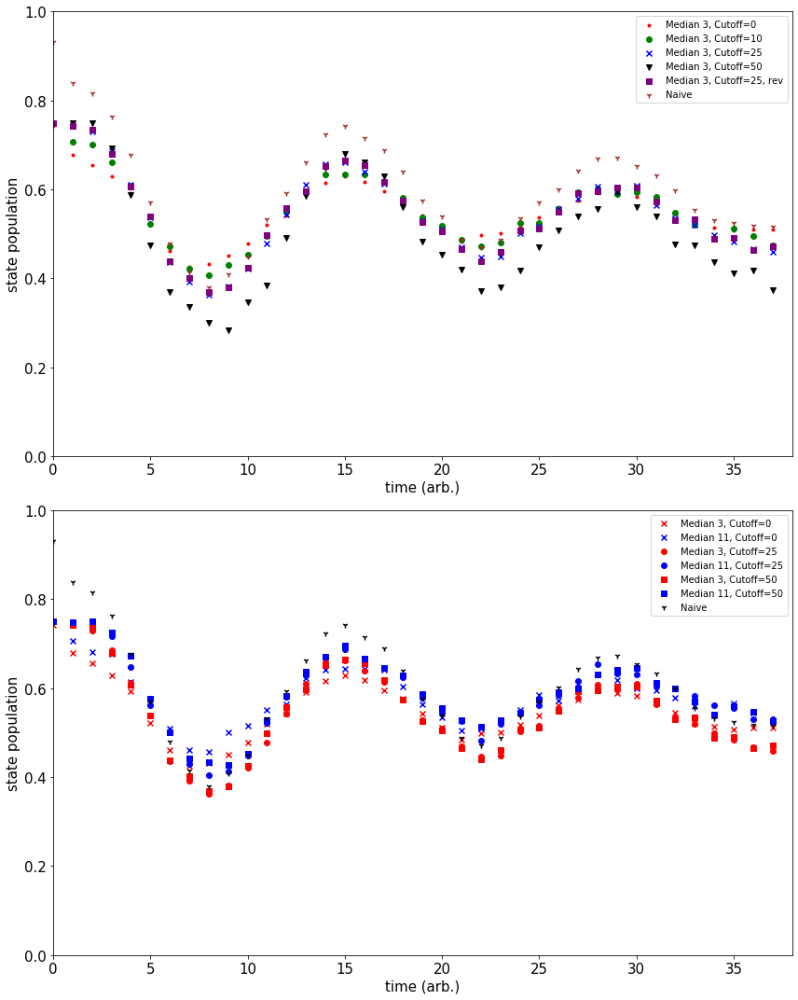

In [1038]:
fig, axe = plt.subplots(2,1, figsize=(12,15))
for subplot in axe:
    subplot.set_xlim(0,38)
    subplot.set_ylim(0,1)
    subplot.tick_params(axis='both', which='major', labelsize=15)
    subplot.set_xlabel("time (arb.)", fontsize=15)
    subplot.set_ylabel("state population", fontsize=15)
    
x = np.arange(38)
labels= ["Median 3, Cutoff=0", "Median 3, Cutoff=10", "Median 3, Cutoff=25","Median 3, Cutoff=50","Median 3, Cutoff=25, rev",]
c = ['red', 'green', 'blue', 'black', 'purple', 'brown']
markers = ['.', 'o', 'x', 'v', 's', '1']
for i in range(5):
    axe[0].scatter(x, med[i,0][:,0], label=labels[i], color=c[i], marker=markers[i])
axe[0].scatter(x, med[0,0][:,1], label="Naive", color=c[5], marker=markers[5] )
axe[0].legend()


labels= ["Median 3, Cutoff=0", "Median 11, Cutoff=0","Median 3, Cutoff=25", "Median 11, Cutoff=25","Median 3, Cutoff=50", "Median 11, Cutoff=50", ]
c = ['red', 'blue', 'red', 'blue', 'red', 'blue']
markers = ['x', 'x', 'o', 'o', 's', 's']
inds = [(0,0), (0,2), (2, 0), (2, 2), (4, 0), (4, 2)]
for i, (a, b) in enumerate(inds):
    axe[1].scatter(x, med[a,b][:,0], label=labels[i], color=c[i], marker=markers[i])
axe[1].scatter(x, med[0,0][:,1], label="Naive", color='black', marker='1' )
axe[1].legend()







plt.plot()

In [1034]:
# def k_means_clustering(data, K=2, threshold = 1e-3, max_iter=1000):

#     mus = np.array([[20,38], [18, 68]])
    
#     clusters = np.zeros(len(data))
#     new_mus = None
#     it = 0
#     change = True
#     while it < max_iter:
#         if it %100 == 0:
#             print(f"Iteration: {it}")
#         for i, (x, y) in enumerate(data):
#             dists = np.linalg.norm(np.array([x, y]) - mus, axis=1)
#             clusters[i] = np.argmin(dists)
#         a = np.sum(np.where(clusters == 0, data[:,0], 0))/np.sum(clusters == 0)
#         b =np.sum(np.where(clusters == 0, data[:,0], 0))/np.sum(clusters == 0)

#         c= np.sum(np.where(clusters == 1, data[:,0], 0))/np.sum(clusters == 1)
#         d = np.sum(np.where(clusters == 1, data[:,0], 0))/np.sum(clusters == 1)   
        
#         new_mus = np.array([[a,b],[c,d]])
#         if np.all(new_mus == mus):
#             print('converged')
#             break
#         mus = new_mus
#         it += 1
#     return data, mus, clusters

def k_means_clustering(centroids, data, max_iter=30, print_every=50):
    centroids_ind = np.zeros(len(data))  # which cluster each pixel belongs to
    for iter in range(max_iter):
        if iter % print_every == 0:
            print("Iteration: ", str(iter))
        for i in range(len(data)):
            minDist = 100000000 #arb
            for k in range(len(centroids)):
                d = np.linalg.norm(data[i]-centroids[k])
                if  d < minDist:
                    centroids_ind[i] = k
                    minDist = d
        new_centroids = np.zeros((len(centroids), 2))
        number_per_cluster = np.zeros(len(centroids))
        for i in range(len(data)):
            new_centroids[int(centroids_ind[i])] += data[i]
            number_per_cluster[int(centroids_ind[i])] += 1
        for i in range(len(new_centroids)):
            new_centroids[i] /= max(number_per_cluster[i],1)
        centroids = new_centroids

    return centroids, centroids_ind

Iteration:  0
Iteration:  0
Iteration:  0
Iteration:  0
Iteration:  0


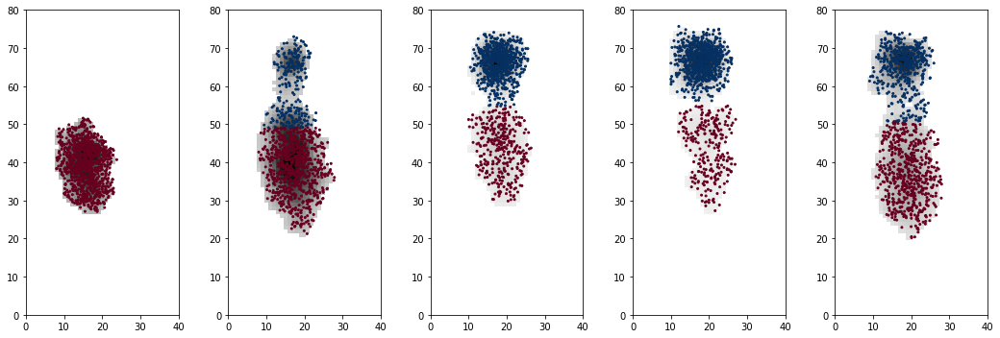

In [1233]:
inds = [0,3,6,9,12]
images= [ ]
fig, axe = plt.subplots(1,5, figsize=(3*5,5))
for i, each in enumerate(inds):
    with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
        im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{each}')), cutoff=0)
        im = threshold(gaussian_filter(im, 5, 2), 25)
        

    data=generate_dataset(im)
    centroids, centroids_ind = k_means_clustering(np.array([[20,38], [18, 68]]), data)
    

    axe[i].scatter(data[:,0], data[:,1],c=centroids_ind, cmap='RdBu', s=4)
    axe[i].set_xlim(0, 40)
    axe[i].set_ylim(0,80)
#     axe[i].set_title(centroids)
    axe[i].imshow(im, origin = 'lower left', cmap = 'binary')
os.chdir("C:/Users/Erik Porter/Desktop/Stanford/CS 229/CS-229-Final-Project")
plt.savefig("kmeans.png")
plt.show()


Processing: 0
Processing: 1
Processing: 2
Processing: 3
Processing: 4
Processing: 5
Processing: 6
Processing: 7
Processing: 8
Processing: 9
Processing: 10
Processing: 11
Processing: 12
Processing: 13
Processing: 14
Processing: 15
Processing: 16
Processing: 17
Processing: 18
Processing: 19
Processing: 20
Processing: 21
Processing: 22
Processing: 23
Processing: 24


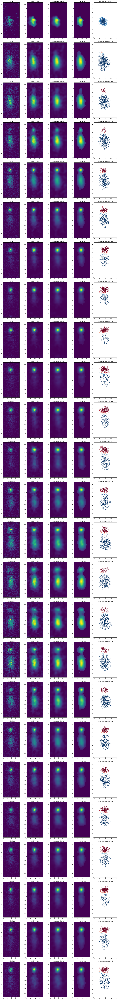

In [1110]:
images= [ ]
inds = np.arange(25)
fig, axe = plt.subplots(len(inds),5, figsize=(3*5,5*len(inds)))

gauss_sig = 2
gauss_size=5
med_size=5
co = 15
rabi1_c015 = np.zeros((25,2))
rabi2 = np.zeros((25,2))





with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    for i, each in enumerate(inds):
        print(f"Processing: {i}")
        im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{each}')), cutoff=0)
        axe[i][0].imshow(im, origin='bottom left')
        axe[i][0].set_title(f'Original {each}')
        
        im = median_filter(im,med_size)
        axe[i][1].imshow(im, origin='bottom left')
        axe[i][1].set_title(f'Median Filter')
        
        im = gaussian_filter(im, gauss_size, gauss_sig)
        axe[i][2].imshow(im, origin='bottom left')
        axe[i][2].set_title(f'Gaussian Filtered')
        
        im = threshold(im,co)
        axe[i][3].imshow(im, origin='bottom left')
        axe[i][3].set_title(f'Thresholded')
        
        
        
        data = generate_dataset(im, N=1000)
        w, phi, mu, sigma = main(data, semi_supervised=True, seed=False, alpha=20)
        rabi1_c015[i, :] = phi
        rabi2[i, :] = list(naive_phi(1, i))
        axe[i][4].scatter(data[:,0], data[:,1], s=3, c=w[:,0], cmap='RdBu')
        axe[i][4].set_xlim(0,40)
        axe[i][4].set_ylim(0, 85)
        axe[i][4].set_title(f'Processed ({np.round(phi[0],2)}/{np.round(phi[1],2)})')

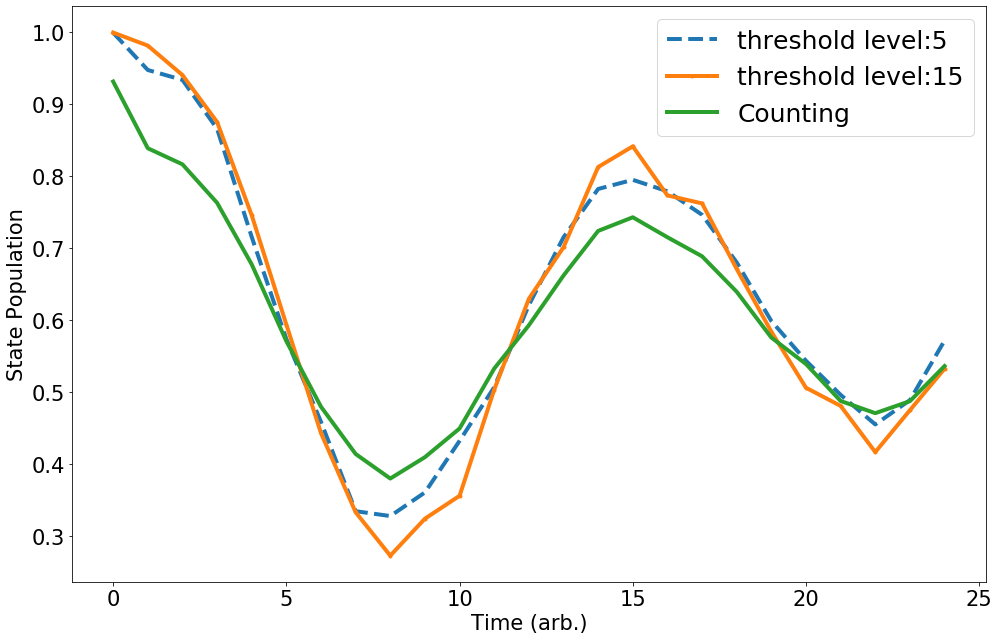

In [1122]:
# plt.scatter(np.arange(len(rabi1)), rabi1[:,0], label = 'ML (1S0)', s=50)
# plt.scatter(np.arange(len(rabi1)), rabi1[:,1], label = 'ML (3P1)', s=50)
# plt.scatter(np.arange(len(rabi1)), rabi2[:,0], label = 'Naive (1S0)', s=50, marker='x')
# plt.scatter(np.arange(len(rabi1)), rabi2[:,1], label = 'Naive (3P1)', s=50, marker='x')
plt.plot(rabi1[:,0], '--', label='threshold level:5', lw=4)
plt.plot(rabi1_c015[:,0], '.-', label='threshold level:15', lw=4)
plt.plot(rabi2[:,0],'-', label='Counting', lw=4)
plt.xticks(fontsize=21)
plt.yticks(fontsize=21)
plt.ylabel("State Population", fontsize=21)
plt.xlabel('Time (arb.)', fontsize=21)
plt.legend(loc='upper right', fontsize=25)
plt.show()

In [1126]:
# Animation with improved performance



frame_num = 38
points = 300
name = 'RabiFloppingBest'

images= [ ]
inds = np.arange(frame_num)

gauss_sig = 2
gauss_size=5
med_size=5
co = 15
rabi1_c015 = np.zeros((38,2))
rabi2 = np.zeros((38,2))

with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    for i, each in enumerate(inds):
        print(f"Processing: {i}")
        im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{each}')), cutoff=0)
        im = median_filter(im,med_size)
        im = gaussian_filter(im, gauss_size, gauss_sig)
        im = threshold(im,co)
        images.append(im)
        
x = np.linspace(0, upperb_y-lowerb_y, points) 
y = np.linspace(0, upperb_x-lowerb_x, points)
X,Y = np.meshgrid(x, y)
pos  = np.dstack((X, Y))
zarray = np.zeros((points, points,frame_num))

for i in range(frame_num):
    if i % 10 == 0:
        print(f"Generating Frame {i}")
    data = generate_dataset(images[i], seed=False, N=1000)
    w, phi, mu, sigma = main(data, seed=False, semi_supervised=True, alpha=20)

    Z = sum([phi[i]*multivariate_normal(mu[i], sigma[i]).pdf(pos) for i in range(len(mu))])
    zarray[:,:,i] = Z
    
for i in range(frame_num):
    fig = plt.figure(figsize=(14,9))
    ax = plt.axes(projection='3d')
    ax.view_init(65, -30)
    ax.plot_surface(X,Y,zarray[:,:,i], cmap='Blues')
    ax.set_xlabel('x', fontsize=15)
    ax.set_ylabel('y', fontsize=15)
    ax.set_zlabel('Probability', fontsize=15)
    ax.set_xlim(0,40)
    ax.set_ylim(0,80)
    ax.set_zlim(0, 0.01)
    ax.set_title('Rabi Flopping between |1S0> and |3P1>: Frame: ' + str(i), fontsize=20)
    plt.savefig(f"{name}{i}.png")
    plt.close()
    

frames = [Image.open(frame) for frame in get_frames(name)]
frames[0].save(f"{name}.gif", format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

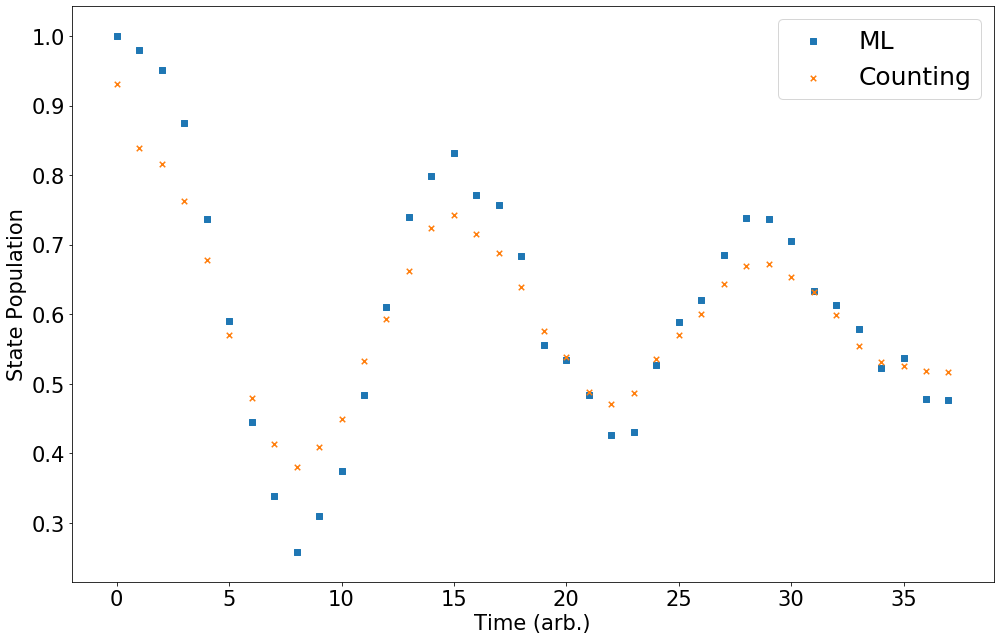

In [1131]:


# rabi1 = np.zeros((38,2))
# rabi2 = np.zeros((38,2))

# for i in range(frame_num):
#     if i % 10 == 0:
#         print(f"{i}")
#     data = generate_dataset(images[i], seed=False, N=1000)
#     w, phi, mu, sigma = main(data, seed=False, semi_supervised=True, alpha=20)
#     rabi1[i,:] = phi
#     rabi2[i,:] = list(naive_phi(1,i))
plt.scatter(np.arange(len(rabi1)),rabi1[:,0], label='ML', s=30, marker='s')
plt.scatter(np.arange(len(rabi1)), rabi2[:,0], label='Counting', s=30, marker='x')
plt.xticks(fontsize=21)
plt.yticks(fontsize=21)
plt.ylabel("State Population", fontsize=21)
plt.xlabel('Time (arb.)', fontsize=21)
plt.legend(loc='upper right', fontsize=25)
plt.show()

In [1172]:
inds = [0,3,6,9,12,15]
images = []
# ps =  np.append(np.append(np.arange(25, 196, 5), np.arange(200, 1499,25)) , np.arange(1500, 2001, 100))
ms = np.array([3,5,7,9,11])

gauss_sig = 2
gauss_size=5
med_size=5
co = 5
phis = np.zeros((len(inds), len(ms)))                       



for j, each in enumerate(inds):
    print(f"Image: {each}")
    for i, m in enumerate(ms):   

        with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
            im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{each}')), cutoff=0)
            im = median_filter(im,m)
            im = gaussian_filter(im, gauss_size, gauss_sig)
            im = threshold(im,5)

        data = generate_dataset(im, N=1000)
        w, phi, mu, sigma = main(data, semi_supervised=True, seed=False, alpha=20)
        phis[j, i] = phi[0]
    



Image: 0
Image: 3
Image: 6
Image: 9
Image: 12
Image: 15


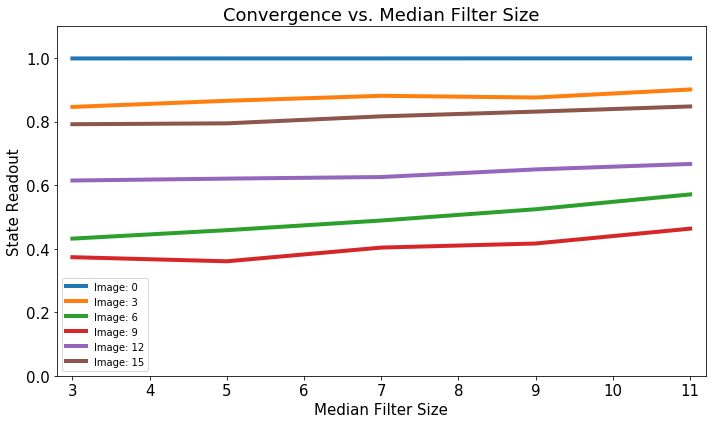

In [1177]:
fig, axe = plt.subplots(1, figsize=(10,6))
for i in range(len(inds)):
    axe.plot(ms, phis[i, :], label='Image: ' + str(inds[i]), lw=4)
axe.set_xlim(2.8,11.2)
axe.set_ylim(0,1.1)
axe.set_title("Convergence vs. Median Filter Size", fontsize=18)
axe.set_xlabel('Median Filter Size', fontsize=15)
axe.set_ylabel('State Readout', fontsize=15)
axe.tick_params(axis='both', which='major', labelsize=15)
plt.legend()
plt.show()

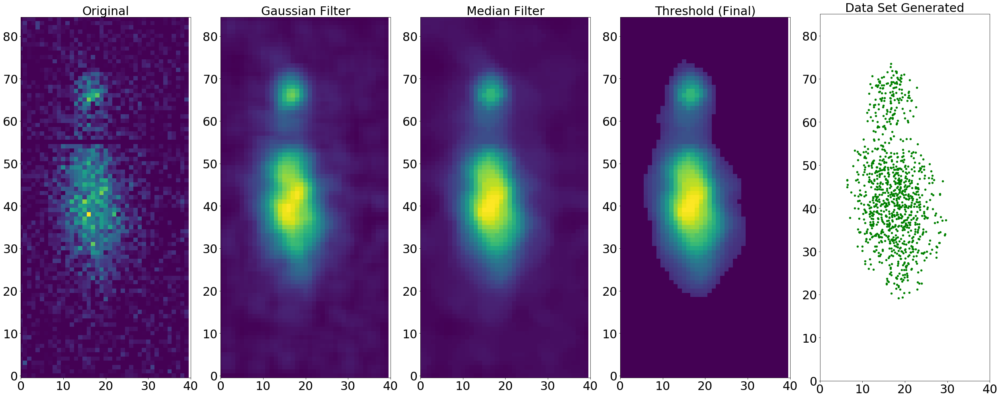

In [1230]:
import os
with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    im1 = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image3')), cutoff= 0)
    im2 = gaussian_filter(im1, 5, 2)
    im3 = median_filter(im2, 5)
    im4 = threshold(im3, 15)


fig, axs = plt.subplots(1,5, figsize=(35, 14))
axs[0].imshow(im1, cmap='viridis', origin='lower left')
axs[0].set_xlim(0,40)
axs[0].set_title('Original', fontsize=30)

axs[1].imshow(im2, cmap='viridis', origin='lower left')
axs[1].set_xlim(0,40)
axs[1].set_title('Gaussian Filter', fontsize=30)

axs[2].imshow(im3, cmap='viridis', origin='lower left')
axs[2].set_xlim(0,40)
axs[2].set_title('Median Filter', fontsize=30)

axs[3].imshow(im4, cmap='viridis', origin='lower left')
axs[3].set_xlim(0,40)
axs[3].set_title('Threshold (Final)', fontsize=30)

d = generate_dataset(im4, N=1000)
axs[4].scatter(d[:,0], d[:,1], s=20, color='green')
axs[4].set_title('Data Set Generated', fontsize=30)
axs[4].set_xlim(0,40)
axs[4].set_ylim(0,85)

for subplot in axs:
    subplot.tick_params(axis='both', which='major', labelsize=30)

os.chdir("C:/Users/Erik Porter/Desktop/Stanford/CS 229/CS-229-Final-Project")
plt.savefig("Filtering.png")
plt.show()
    

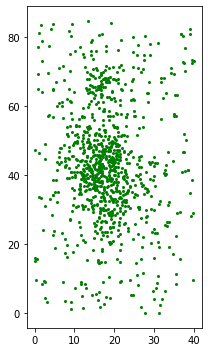

In [1203]:
fig, axe = plt.subplots(1, figsize=(3,5))
d = generate_dataset(im, N=1000)
axe.scatter(d[:,0], d[:,1], s=4, color='green')

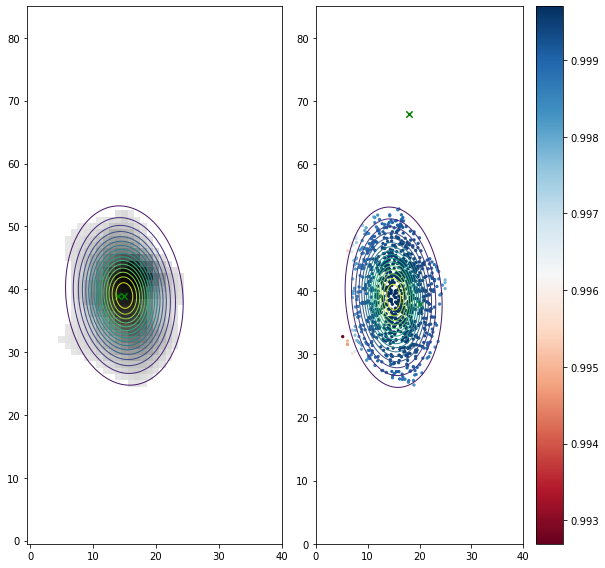

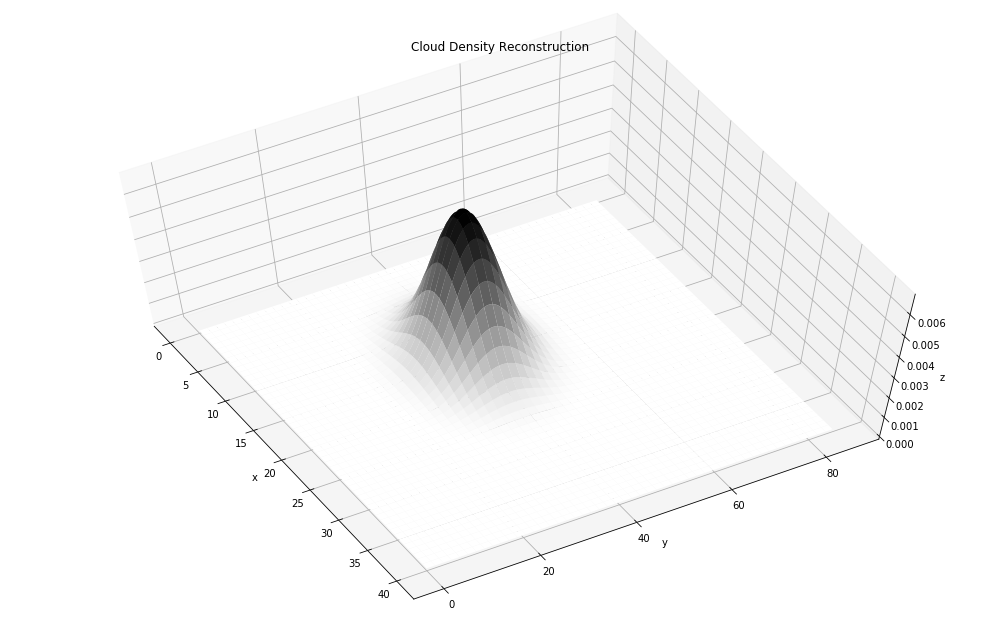

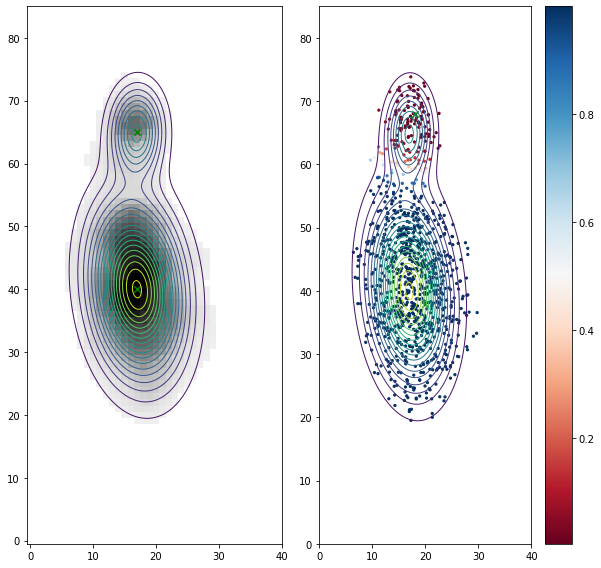

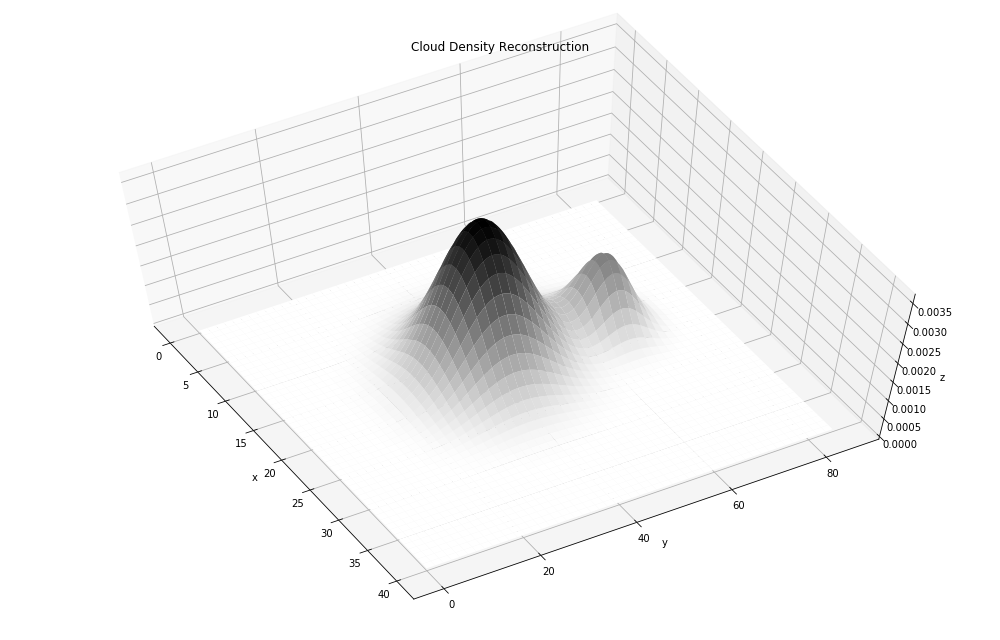

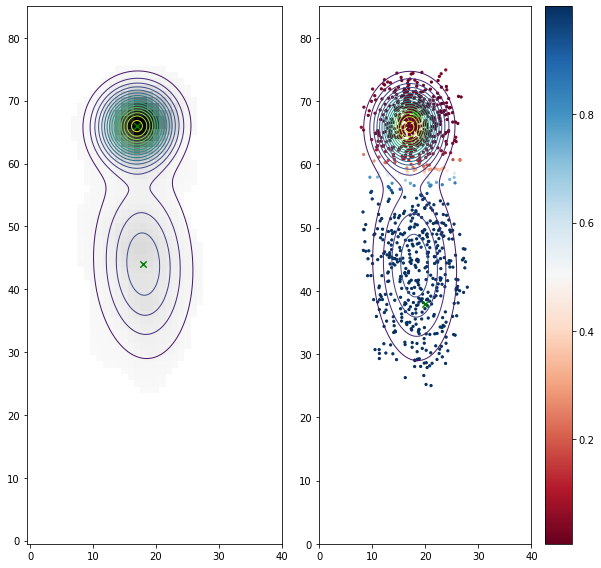

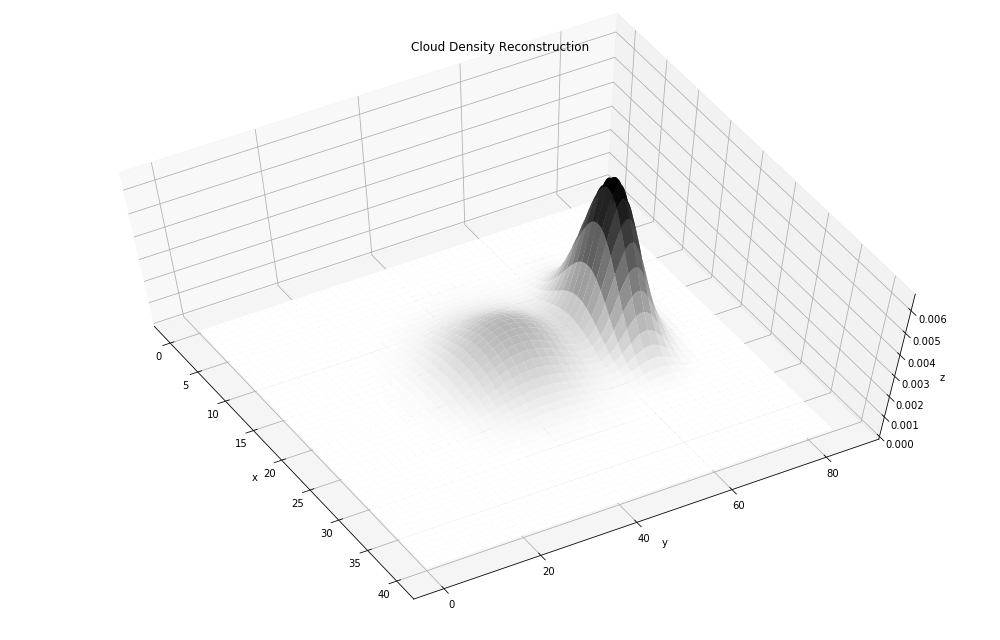

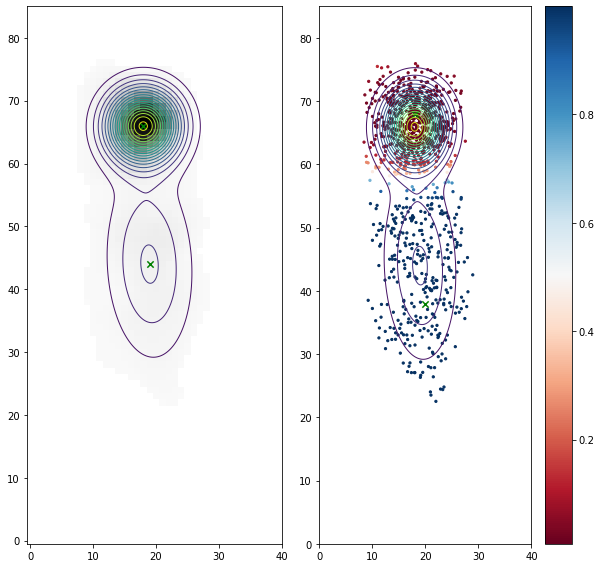

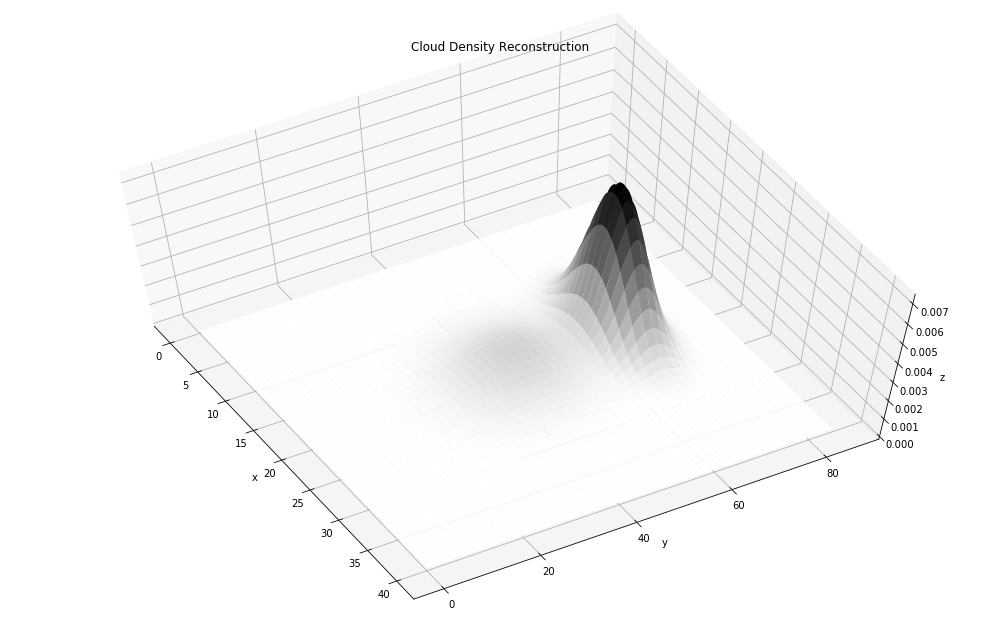

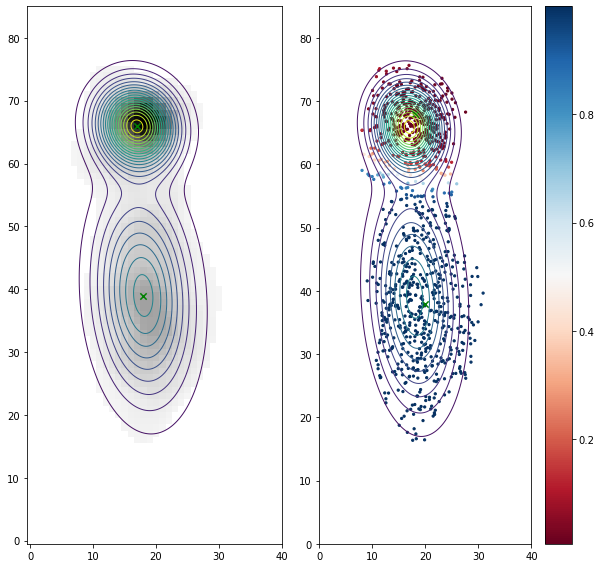

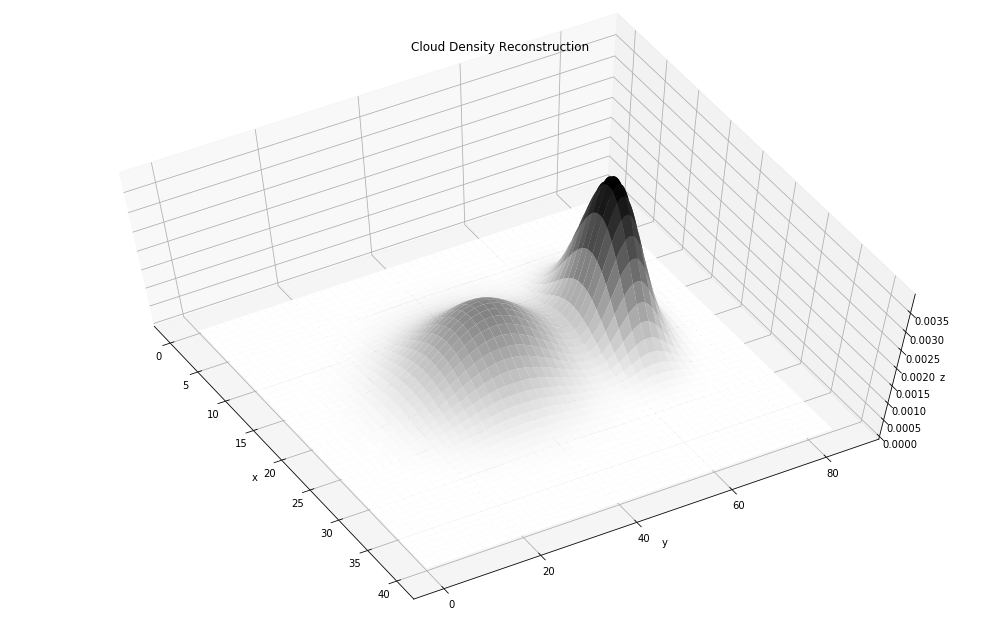

In [1236]:
images = []
inds = [0,3,6,9,12]



with h5.File(f"C:/Users/Erik Porter/Desktop/Jupyter Notebooks/Clouds1.h5", 'r') as file:
    for j in inds:
        im = pre_process(np.array(file.get(f'datasets/detection.images.background_subtracted_image{j}')), cutoff=0)
        im = gaussian_filter(im, 5, 2)
        im = median_filter(im, 5)
        im = threshold(im, 15)                
        images.append(im)
        
for i in range(len(images)):
    data = generate_dataset(images[i], seed=False, N=1000)
    w, phi, mu, sigma = main(data, seed=False, semi_supervised=True, alpha=20)
    visualize(images[i], data, w, phi, mu, sigma, threeD=True)
    